#Check GPU


In [ ]:
from tensorflow.python.client import device_lib

def get_available_gpus():
    local_device_protos = device_lib.list_local_devices()
    # print(local_device_protos)
    return [x.physical_device_desc for x in local_device_protos if x.device_type == 'GPU']
get_available_gpus()    

['device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0']

In [2]:
!pip list -v 

Package                Version     Location                               Installer
---------------------- ----------- -------------------------------------- ---------
absl-py                0.9.0       /usr/local/lib/python3.7/site-packages pip      
astunparse             1.6.3       /usr/local/lib/python3.7/site-packages pip      
attrs                  19.3.0      /usr/local/lib/python3.7/site-packages pip      
backcall               0.1.0       /usr/local/lib/python3.7/site-packages pip      
bleach                 3.1.5       /usr/local/lib/python3.7/site-packages pip      
cachetools             4.1.0       /usr/local/lib/python3.7/site-packages pip      
certifi                2020.4.5.1  /usr/local/lib/python3.7/site-packages pip      
chardet                3.0.4       /usr/local/lib/python3.7/site-packages pip      
cycler                 0.10.0      /usr/local/lib/python3.7/site-packages pip      
decorator              4.4.2       /usr/local/lib/python3.7/site-packages pi

# Mount Drive

In [4]:
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
    print('Note: using Google CoLab')
    COLAB = True
except:
    print('Note: not using Google Colab')
    COLAB = False

if COLAB:
    # root_path = "/content/drive/My Drive/licenta AC/Chesa/data"
    root_path = "/content/drive/Shared drives/ai-memes"
else:
    root_path = "./data"

Note: not using Google Colab


# Get Dataset
* **root_captioning** = "/content/drive/My Drive/licenta AC/Chesa/data"
* **lookup** -> dict key: Meme id, value list captions containing words & punctuations splitted by space
* delete punctuations so that words will be found in Glove
* remove non ascii captions
* lex -> set of unique words
* max_length -> Maximum length of a caption (in words)

# Prepare Dataset
* split into **train** and **test**
* train_images set, train_img list, string path '3001612175_53567ffb58.jpg'
* train_descriptions set, add start/stop get from lookup by train_image 
  ['2092870249_90e3f1855b': ['startseq a ... , ... a jack . endseq'],]
* all_train_captions - all merged in list

# Build Neural Networks
* build **InceptionV3**
* encode img features in **train.pkl**
* build vocab, cut words with least occurrences
* load **glove** embeddings
* build embedding matrix for vocab
* build **LSTM**

# Caption
* implement caption prediction beam search



In [5]:
import string

null_punct = str.maketrans('', '', string.punctuation)

def clean_data(list):
  for desc in list:
    desc = [word.lower() for word in desc.split()]
    desc = [w.translate(null_punct) for w in desc]
    desc = [word for word in desc if word.isalpha()]
    desc = [word for word in desc if len(word)>1]
    yield ' '.join(desc)

In [6]:
import os
from pathlib import Path
import json
from tqdm import tqdm
from functools import reduce
from random import random

isascii_word = lambda w: len(w) == len(w.encode())
isascii_list = lambda l: reduce(lambda rez, word: rez & True if isascii_word(word) else False & rez, l, True)
dirname = os.path.join(root_path, 'ImgFlip500K_Dataset', 'memes')
lookup = dict()

def print_iterator(it):
    for x in it:
        print(x, end='\n')
    print('')  # for new line
  
def load_memes(start=0, end=100):
  i = 0
  for filename in tqdm(os.listdir(dirname)): # foreach json file in memes
      i += 1
      if i < start or i > end:
        continue
      meme_name = Path(filename).stem # remove file extension
      with open(os.path.join(dirname, filename)) as json_file:
        memes = json.load(json_file)
        # lookup[meme_name] = list(map(lambda meme: ' | '.join(meme['boxes']), memes))
        lookup[meme_name] = []
        for meme in memes:
          words = ' | '.join(clean_data(meme['boxes']))
          if isascii_list(words):
            lookup[meme_name].append(words)

load_memes()
print(f'Memes loaded: {len(lookup)}') # 99 memes, in the latest dataset 100
print(f'Meme example: {lookup[list(lookup)[0]][0]}') # when you off the dope | and you think you a bird

100%|██████████| 99/99 [00:29<00:00,  3.30it/s]

Memes loaded: 99
Meme example: what if youre the meme | and im looking at you


In [7]:
max_length = 0
lex = set() # set of unique words
# for key in lookup:
#   [lex.update(d.split()) for d in lookup[key]]
#   big_word = reduce(lambda l, rez: len(max(l.split(), key=lambda x: len(x))) if len(max(l.split(), key=lambda x: len(x))) > len(rez) else rez, lookup[key])
#   if(len(big_word)> max_length):
#     max_length = len(big_word)
#     max_word = big_word
#   break
for desc in lookup:
  for word in desc.split():
    lex.add(word)
    if max_length < len(word):
      max_length=max(max_length,len(word))
      max_word = word

print(f'Unique words: {len(lex)}')
print(f'Biggest word: {max_length} chars')
print(max_word)

Unique words: 99
Biggest word: 46 chars
Bernie-I-Am-Once-Again-Asking-For-Your-Support


In [8]:
START = "startseq"
STOP = "endseq"
# same as lookup but captions wrapped in Start/Stop
train_descriptions = {k:v for k,v in lookup.items()}
for n,v in train_descriptions.items(): 
  for d in range(len(v)):
    v[d] = f'{START} {v[d]} {STOP}'
max_length += 2 # update maximum caption length
print(f'Wrapped captions in Start/Stop')

Wrapped captions in Start/Stop


In [9]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
import tensorflow.keras.applications.inception_v3
from tensorflow.keras.models import Model

encode_model = InceptionV3(weights='imagenet')
encode_model = Model(encode_model.input, encode_model.layers[-2].output)
WIDTH = 299
HEIGHT = 299
OUTPUT_DIM = 2048
preprocess_input = tensorflow.keras.applications.inception_v3.preprocess_input

print('InceptionV3 loaded!')

96116736/96112376 [==============================] - 8s 0us/step
InceptionV3 loaded!


In [10]:
from PIL import Image
import tensorflow.keras.preprocessing.image
import numpy as np

def encodeImage(img):
  # Resize all images to a standard size (specified bythe image encoding network)
  img = img.resize((WIDTH, HEIGHT), Image.ANTIALIAS)
  # Convert a PIL image to a numpy array
  x = tensorflow.keras.preprocessing.image.img_to_array(img)
  # Expand to 2D array
  x = np.expand_dims(x, axis=0)
  # Perform any preprocessing needed by InceptionV3 or others
  x = preprocess_input(x)
  # Call InceptionV3 (or other) to extract the smaller feature set for the image.
  x = encode_model.predict(x) # Get the encoding vector for the image
  # Shape to correct form to be accepted by LSTM captioning network.
  x = np.reshape(x, OUTPUT_DIM )
  return x

In [11]:
# Nicely formatted time string
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return f"{h}:{m:>02}:{s:>05.2f}"

In [12]:
import pickle
from time import time

train_path = os.path.join(root_path,'ImgFlip500K_Dataset',"data",f'train{OUTPUT_DIM}.pkl')
if not os.path.exists(train_path):
  start = time()
  encoding_train = {}
  train_images_path = os.path.join(root_path,'ImgFlip500K_Dataset','templates','img') 
  for image_path in tqdm(os.listdir(train_images_path)):
    # print(image_path)
    img = tensorflow.keras.preprocessing.image.load_img(os.path.join(train_images_path,image_path), target_size=(HEIGHT, WIDTH))
    encoding_train[image_path] = encodeImage(img)
  with open(train_path, "wb") as fp:
    pickle.dump(encoding_train, fp)
  print(f"\nGenerating training set took: {hms_string(time()-start)}")
else:
  with open(train_path, "rb") as fp:
    encoding_train = pickle.load(fp)
print('Loaded')

Loaded


In [13]:
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)
# print(all_train_captions)

Words that do not occur very often can be misleading to neural network training.  It is better to simply remove such words.  Here we remove any words that occur less than 10 times.  We display what the total vocabulary shrunk to.

In [14]:
word_count_threshold = 1
word_counts = {}
nsents = 0 # number of sentences
for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('preprocessed words %d ==> %d' % (len(word_counts), len(vocab)))

preprocessed words 127547 ==> 127547


Next we build two lookup tables for this vocabulary. One idxtoword convers index numbers to actual words to index values.  The wordtoidx lookup table performs the opposit.

In [15]:
idxtoword = {}
wordtoidx = {}

ix = 1
for w in vocab:
    wordtoidx[w] = ix
    idxtoword[ix] = w
    ix += 1
    
vocab_size = len(idxtoword) + 1 
vocab_size

127548

 # Loading Glove Embeddings

In [16]:
glove_dir = os.path.join(root_path,'glove.6B')
embeddings_index = {} 
f = open(os.path.join(glove_dir, 'glove.6B.200d.txt'), encoding="utf-8")

for line in tqdm(f):
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs

f.close()
print(f'Found {len(embeddings_index)} word vectors.')

400000it [00:28, 14250.14it/s]

Found 400000 word vectors.


An embedding matrix is built from Glove.  This will be directly copied to the weight matrix of the neural network.

In [17]:
embedding_dim = 200

# Get 200-dim dense vector for each of the 10000 words in out vocabulary
embedding_matrix = np.zeros((vocab_size, embedding_dim))
not_found = []
for word, i in wordtoidx.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector
    else: 
      not_found.append(word)
print(f'Not founded words: {len(not_found)} from total of {len(wordtoidx)}')


Not founded words: 67437 from total of 127547


Clean captions that contain not founded words

In [18]:
eliminated = 0
def hasNotFoundWord(desc):
  global eliminated
  stripped_desc = desc.split()[1:-1]
  if bool(set(not_found) & set(stripped_desc)):
    eliminated += 1
    return True
  else:
    return False

train_desc_path = os.path.join(root_path,'ImgFlip500K_Dataset',"data",f'{train_descriptions}.pkl')
if not os.path.exists(train_desc_path):
  for meme in tqdm(train_descriptions):
    train_descriptions[meme] = [desc for desc in train_descriptions[meme] if hasNotFoundWord(desc) == False ]
    # train_descriptions[meme] = [desc for desc in train_descriptions[meme] if all(unknown not in desc.split()[1:-1] for unknown in not_found)]
  # with open(train_desc_path, "wb") as fp:
  #   pickle.dump(train_descriptions, fp)
  print(f"\nGenerated Training Descriptions")
else:
  with open(train_desc_path, "rb") as fp:
    train_descriptions = pickle.load(fp)
  print(f"\n Loaded")

100%|██████████| 99/99 [40:36<00:00, 24.61s/it]  


Generated Training Descriptions


In [19]:
# print(f"\nGenerated Training Descriptions")
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)
# print(f'Removed captions: {eliminated} from total of {len(all_train_captions)}')

#Compile LSTM

In [21]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras import Input, layers
from tensorflow.keras import optimizers
from tensorflow.keras.layers import add

inputs1 = Input(shape=(OUTPUT_DIM,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)
decoder1 = add([fe2,se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)
caption_model = Model(inputs=[inputs1,inputs2], outputs=outputs)

In [22]:
caption_model.layers[2].set_weights([embedding_matrix])
caption_model.layers[2].trainable = False

caption_model.compile(loss='categorical_crossentropy', optimizer='adam')

#Create Callback

In [23]:
import tensorflow as tf
# Create a callback that saves the model's weights
def get_callback(id):
  callback_path = os.path.join(root_path,"ImgFlip500K_Dataset", 'data', str(id) + 'weights.{epoch:02d}.ckpt')
  return tf.keras.callbacks.ModelCheckpoint(filepath=callback_path,
                                                 save_weights_only=True,
                                                 verbose=1)

# Load CheckPoint

In [25]:
# caption_model.load_weights(os.path.join(root_path,"ImgFlip500K_Dataset", 'data', '2weights.02.ckpt'))

# Train Nework

In [26]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical

def data_generator(descriptions, photos, wordtoidx, max_length, num_descriptions_per_batch):
  # x1 - Training data for photos
  # x2 - The caption that goes with each photo
  # y - The predicted rest of the caption
  x1, x2, y = [], [], []
  n=0
  while True:
    for key, desc_list in descriptions.items():
      n+=1
      # print(key+'.jpg')
      photo = photos[key+'.jpg']
      d=0
      # Each photo has 5 descriptions
      for desc in desc_list:
        d+=1
        if d==num_descriptions_per_batch:
          yield ([np.array(x1), np.array(x2)], np.array(y))
          x1, x2, y = [], [], []
          d=0
        # Convert each word into a list of sequences.
        seq = [wordtoidx[word] for word in desc.split(' ') if word in wordtoidx]
        # Generate a training case for every possible sequence and outcome
        for i in range(1, len(seq)):
          in_seq, out_seq = seq[:i], seq[i]
          in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
          out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
          x1.append(photo)
          x2.append(in_seq)
          y.append(out_seq)

In [27]:
import random
train_data = [(key, desc) for key, desc_list in train_descriptions.items() for desc in desc_list ]

def random_data_generator(photos, wordtoidx, max_length, num_descriptions_per_batch):
  # x1 - Training data for photos
  # x2 - The caption that goes with each photo
  # y - The predicted rest of the caption
  x1, x2, y = [], [], []
  while True:
    random.shuffle(train_data)
    d=0
    for key, desc in train_data:
      photo = photos[key+'.jpg']
      d+=1
      if d==num_descriptions_per_batch:
        yield ([np.array(x1), np.array(x2)], np.array(y))
        x1, x2, y = [], [], []
        d=0
      # Convert each word into a list of sequences.
      seq = [wordtoidx[word] for word in desc.split(' ') if word in wordtoidx]
      # Generate a training case for every possible sequence and outcome
      for i in range(1, len(seq)):
        in_seq, out_seq = seq[:i], seq[i]
        in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
        out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
        x1.append(photo)
        x2.append(in_seq)
        y.append(out_seq)

In [28]:
# EPOCHS = 1
# model_path = os.path.join(root_path,'ImgFlip500K_Dataset',"data",f'caption-model.hdf5')
# if not os.path.exists(model_path):
#   for i in tqdm(range(EPOCHS*2)):
#       generator = data_generator(train_descriptions, encoding_train, wordtoidx, max_length, number_pics_per_bath)
#       caption_model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)

#   caption_model.optimizer.lr = 1e-4
#   number_pics_per_bath = 6
#   steps = len(train_descriptions)//number_pics_per_bath

#   for i in range(EPOCHS):
#       generator = data_generator(train_descriptions, encoding_train, wordtoidx, max_length, number_pics_per_bath)
#       caption_model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)  
#   caption_model.save_weights(model_path)
#   print(f"\Training took: {hms_string(time()-start)}")
# else:
#   caption_model.load_weights(model_path)

In [29]:
EPOCHS = 1
start = time()
num_descriptions_per_batch=32
steps = (len(all_train_captions))//num_descriptions_per_batch-1
print(f'steps: {steps}')
model_path = os.path.join(root_path,'ImgFlip500K_Dataset',"data",'caption-model.hdf5')
if not os.path.exists(model_path):

  # generator = random_data_generator(encoding_train, wordtoidx, max_length, num_descriptions_per_batch)
  # print(f'\n Fitting Steps1 {steps}\n')
  # caption_model.fit(generator, epochs=EPOCHS, steps_per_epoch=steps, verbose=1, callbacks=[get_callback(1)])

  num_descriptions_per_batch=32
  caption_model.optimizer.lr = 0.0001
  # #steps=1

  EPOCHS = 8 #10
  # suffle input
  # ecpochs:10 lr:0.001 ecpochs:10 lr:0.0001 loss 4.57

  # Single-30  # Multi-50 # now Started to see difference in wierd words -71
  #72 - optimizer 0001 - final 76 - almost no meme caption diff, loss function jumped to 5
  #76 loss 4.850 - low results, only one beam search showing some captions
  #85 loss stuck at 4.57 - no diff beetween memes
  #batch size 256 OOM
  #batch size 128 OOM
  #batch 32 optimizer 0.0002 88 loss stuck at 4.565 - no diff beetween memes
  #batch 32 optimizer 0.0002 90 loss stuck at 4.565 - no diff beetween memes
  steps = (len(all_train_captions))//num_descriptions_per_batch-1
  generator = random_data_generator(encoding_train, wordtoidx, max_length, num_descriptions_per_batch)
  print(f'\n Fitting Steps1 {steps}\n')
  caption_model.fit(generator, epochs=EPOCHS, steps_per_epoch=steps, verbose=1, callbacks=[get_callback(2)])

  # steps = len(all_train_captions)//num_descriptions_per_batch
  # for i in tqdm(range(EPOCHS)):
  #     generator = data_generator(train_descriptions, encoding_train, wordtoidx, max_length, number_pics_per_bath, num_descriptions_per_batch)
  #     print(f'\n Steps2 {steps}\n')
  #     caption_model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)  
  caption_model.save_weights(model_path)
  print(f"\Training took: {hms_string(time()-start)}")
else:
  caption_model.load_weights(model_path)
  print('Model loaded')

steps: 14128
Model loaded


# Generate Captions

In [30]:
def generateCaption(photo):
    in_text = START
    for i in range(max_length):
        sequence = [wordtoidx[w] for w in in_text.split() if w in wordtoidx]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = caption_model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = idxtoword[yhat]
        in_text += ' ' + word
        print(word)
        if word == STOP:
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

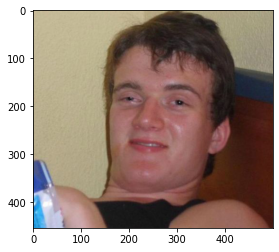

[[0.53977937 0.14935113 0.17767063 ... 0.09022419 0.15059766 0.10495613]]
pod
hope
runny
were
whistle
frog
word
the
our
|
were
runny
were
whistle
word
the
our
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: pod hope runny were whistle frog word the our | were runny were whistle word the our at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


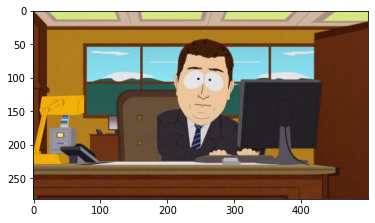

[[0.663665   0.36402673 0.33930582 ... 0.618009   0.0384409  0.1010261 ]]
what
if
service
peed
gun
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


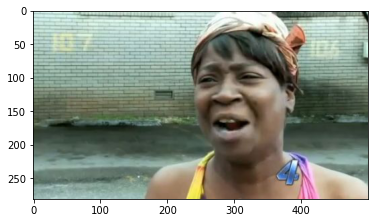

[[0.5661153  0.15732023 0.6688396  ... 1.0275943  0.6657373  0.41827863]]
read
work
of
black
coca
block
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: read work of black coca block at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


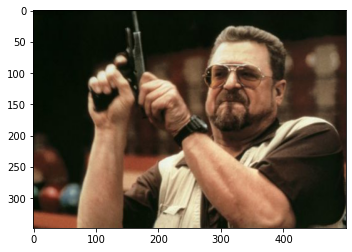

[[0.51120174 0.16270036 0.05240588 ... 0.16754925 0.         0.13578865]]
screams
the
south
snow
robers
got
|
loud
frostbite
voices
mcdonalds
the
brand
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: screams the south snow robers got | loud frostbite voices mcdonalds the brand at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


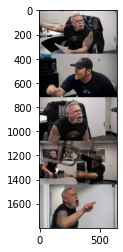

[[0.08775012 0.28272325 0.05430812 ... 0.11564627 0.52769935 0.90516156]]
if
cents
anything
if
drank
plastic
|
if
drank
|
peed
how
|
if
drank
spells
dont
to
all
the
teller
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: if cents anything if drank plastic | if drank | peed how | if drank spells dont to all the teller at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


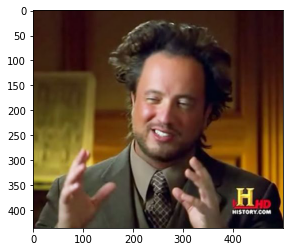

[[0.51805735 0.4385202  0.40738076 ... 0.08193068 0.14324331 0.18517885]]
what
if
service
peed
gun
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


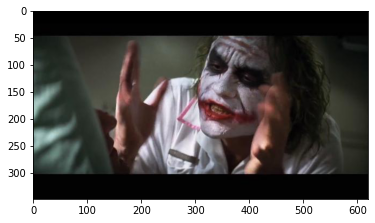

[[0.22268862 0.7167144  0.20597796 ... 0.10961301 0.         0.21848238]]
the
tuna
if
brainstorm
what
if
service
the
people
|
and
my
pools
that
squirt
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: the tuna if brainstorm what if service the people | and my pools that squirt at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


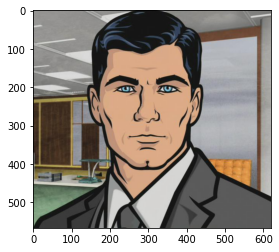

[[0.45319402 0.36670625 0.066638   ... 0.2583431  0.07433583 0.14707541]]
look
if
in
to
salt
to
the
breakfast
me
the
brand
for
open
but
if
salt
to
look
home
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: look if in to salt to the breakfast me the brand for open but if salt to look home at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


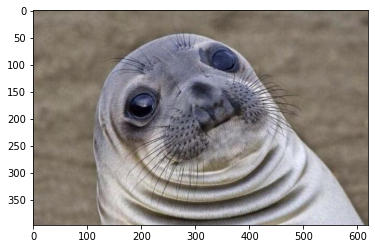

[[0.5552643  0.33615345 0.18456474 ... 0.07900156 0.2642252  0.09005298]]
what
if
ice
|
if
says
to
someone
to
choked
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if ice | if says to someone to choked at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


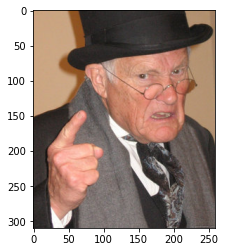

[[0.64577186 0.91193426 0.51385164 ... 0.62823254 0.10891318 0.39440453]]
secret
word
pod
by
|
jungle
math
says
to
someone
to
choked
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: secret word pod by | jungle math says to someone to choked at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


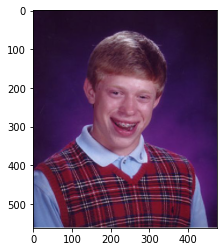

[[0.762411   0.11517891 0.15682426 ... 0.32519552 0.3548621  0.09429964]]
own
cord
|
own
parachute
coca
the
microsoft
by
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: own cord | own parachute coca the microsoft by at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


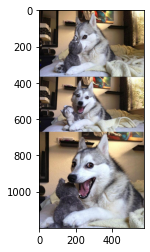

[[0.27354574 0.4040862  0.22242665 ... 0.2141079  0.9992254  0.2957775 ]]
anything
look
if
invented
the
so
loud
vacation
block
the
such
upvotes
me
the
brand
staying
the
chivalrous
race
block
staying
the
chivalrous
race
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: anything look if invented the so loud vacation block the such upvotes me the brand staying the chivalrous race block staying the chivalrous race at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


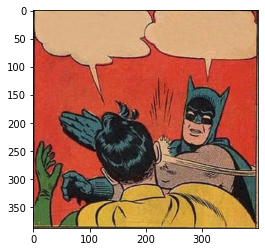

[[0.5968084  0.06991854 0.08102162 ... 0.52534705 0.5163257  1.0350397 ]]
still
spells
mind
block
if
drank
spells
dont
to
all
the
south
snow
loud
staying
spells
the
chivalrous
race
block
staying
spells
the
chivalrous
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: still spells mind block if drank spells dont to all the south snow loud staying spells the chivalrous race block staying spells the chivalrous at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


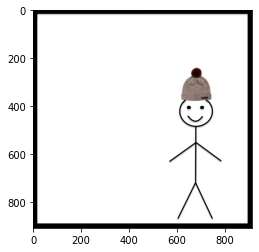

[[0.25831756 0.5589302  0.07910474 ... 0.07706889 0.4353948  0.09447059]]
peptobismol
staying
conspiracy
|
conspiracy
staying
beers
|
conspiracy
staying
beers
|
conspiracy
staying
beers
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: peptobismol staying conspiracy | conspiracy staying beers | conspiracy staying beers | conspiracy staying beers at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


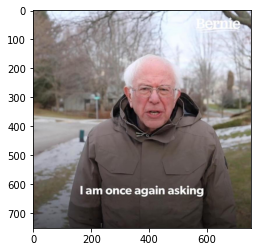

[[0.051433   0.04167898 0.14061806 ... 0.4832735  0.20149665 0.31647468]]
what
if
service
peed
gun
|
and
if
salt
the
street
medicine
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if salt the street medicine at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


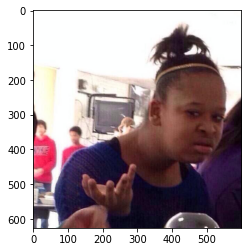

[[0.6338239  0.17487162 0.21347322 ... 0.07698874 0.02536844 0.2956435 ]]
what
if
service
peed
gun
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


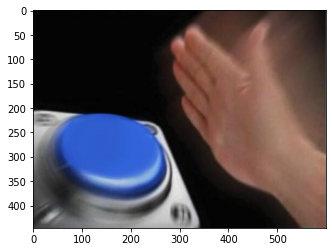

[[0.6639366  0.13272774 0.08331261 ... 0.01205251 0.01046649 0.06856117]]
never
|
spells
to
all
day
at
at
at
at
at
at
at
at
at
|
never
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: never | spells to all day at at at at at at at at at | never at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


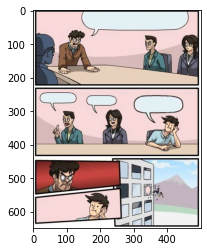

[[0.16536191 0.17268766 0.03034303 ... 0.13539769 0.03961574 0.22378373]]
jungle
toll
to
brainstorm
or
once
roommate
|
brainstorm
today
|
brainstorm
today
|
brainstorm
today
mcdonalds
the
thatll
sharts
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: jungle toll to brainstorm or once roommate | brainstorm today | brainstorm today | brainstorm today mcdonalds the thatll sharts at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


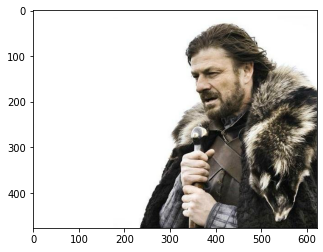

[[0.17077266 0.33254907 0.25436348 ... 0.40459317 0.22007549 0.16095874]]
reverse
pills
|
the
or
today
drank
mom
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: reverse pills | the or today drank mom at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


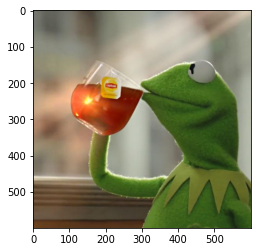

[[0.38301694 0.19570576 0.183251   ... 0.65214884 0.9127073  0.2849552 ]]
if
driving
block
if
drank
spells
dont
to
all
the
warning
race
always
open
puzzle
me
pod
sown
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: if driving block if drank spells dont to all the warning race always open puzzle me pod sown at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


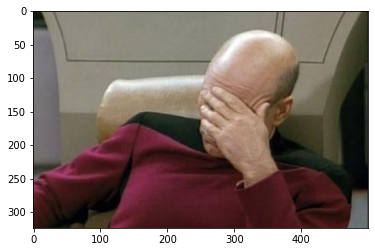

[[0.31560856 0.23419236 0.66249716 ... 0.17170142 0.7585857  0.26148883]]
what
if
service
peed
gun
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


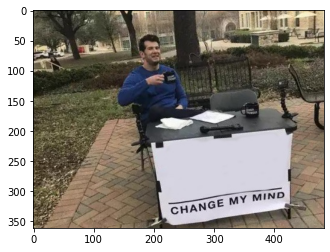

[[0.29937077 0.2171264  0.19255629 ... 0.16288617 0.12255596 0.7925002 ]]
the
disappointment
staying
bottles
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: the disappointment staying bottles at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


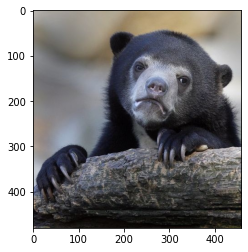

[[0.1776424  0.12470805 0.13873702 ... 0.14310044 0.02704973 0.11984013]]
what
if
service
peed
gun
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


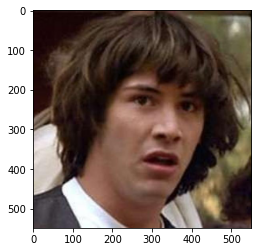

[[0.3652414  0.89228344 0.10006027 ... 0.2435891  0.10768781 0.48672116]]
anything
cds
the
russia
staying
lost
for
trial
drank
lost
for
trial
drank
lost
for
trial
drank
lost
for
trial
drank
lost
for
trial
drank
lost
for
trial
drank
lost
for
trial
drank
lost
for
trial
drank
lost
for
trial
drank
lost
for
trial
drank
binfection
medium
fries
Caption: anything cds the russia staying lost for trial drank lost for trial drank lost for trial drank lost for trial drank lost for trial drank lost for trial drank lost for trial drank lost for trial drank lost for trial drank lost for trial drank binfection medium
_____________________________________


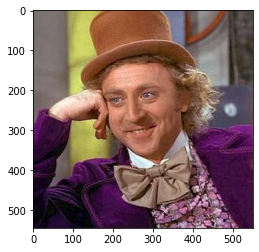

[[0.40767854 0.25577366 0.8915133  ... 0.26278937 0.31257567 0.22176395]]
binfection
if
im
if
drank
dont
to
all
the
south
snow
loud
staying
block
if
points
never
world
but
if
drank
spells
some
anything
if
drank
plastic
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: binfection if im if drank dont to all the south snow loud staying block if points never world but if drank spells some anything if drank plastic at at at at at at at at at at at at at at at at at at at at
_____________________________________


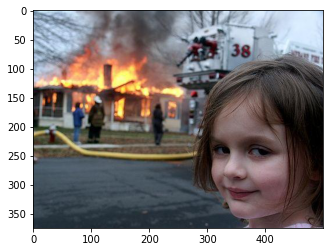

[[0.46140403 0.47714692 0.39678723 ... 1.311313   0.64189255 0.23033431]]
what
if
salt
the
alliance
stretching
|
and
if
salt
the
stretching
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if salt the alliance stretching | and if salt the stretching at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


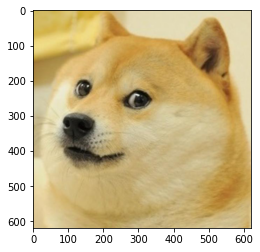

[[0.20040223 0.8463101  0.1774972  ... 0.06869259 0.2860371  0.12939428]]
what
if
service
peed
gun
|
and
if
service
peed
|
how
|
and
if
service
peed
how
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if service peed | how | and if service peed how at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


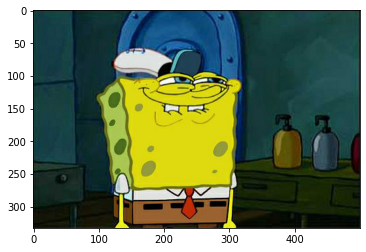

[[0.45923215 0.52761006 0.30493286 ... 0.5193167  0.3165743  0.06423713]]
what
if
service
peed
gun
|
and
if
service
peed
gun
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if service peed gun at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


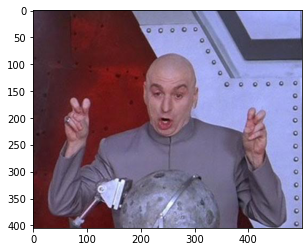

[[0.52371025 0.02797182 0.2413274  ... 0.07269996 0.35586685 0.7399187 ]]
what
if
service
peed
gun
|
and
if
service
peed
gun
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if service peed gun at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


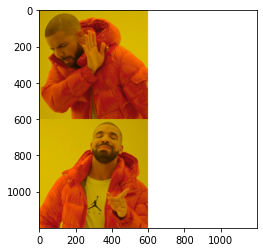

[[0.18527004 0.16958022 0.5827869  ... 0.12969777 0.14496124 1.0578305 ]]
what
if
service
peed
gun
|
and
if
says
to
someone
to
choked
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if says to someone to choked at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


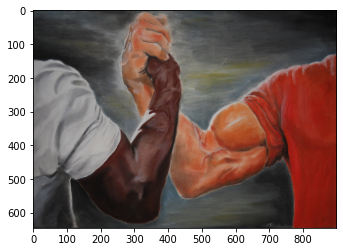

[[0.53972244 0.00367133 0.25925443 ... 0.03918828 0.12520182 1.0354874 ]]
the
brand
|
the
brand
|
the
brand
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: the brand | the brand | the brand at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


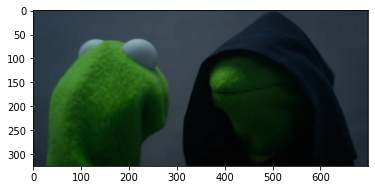

[[0.06945314 0.21634966 0.2654338  ... 0.19543684 0.08922815 0.15499976]]
never
|
never
|
pod
how
at
at
at
at
at
at
at
at
|
never
at
|
never
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: never | never | pod how at at at at at at at at | never at | never at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


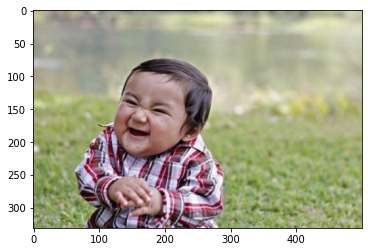

[[0.10105072 0.5626087  0.17780998 ... 0.74830836 0.00337823 0.00535681]]
what
if
salt
peed
age
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if salt peed age | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


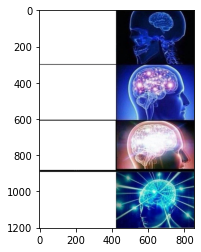

[[0.06455708 0.1025549  1.0624189  ... 0.21775496 0.37401295 0.7465538 ]]
the
disappointment
staying
bottles
|
the
disappointment
staying
bottles
|
the
disappointment
staying
bottles
|
the
disappointment
staying
bottles
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: the disappointment staying bottles | the disappointment staying bottles | the disappointment staying bottles | the disappointment staying bottles at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


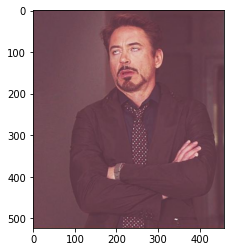

[[0.09895232 0.10321832 0.38953376 ... 0.1241819  0.32163334 0.26962584]]
what
if
service
peed
gun
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


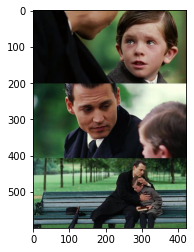

[[0.13558337 1.2612445  0.11184873 ... 0.46902126 0.0898504  0.10017984]]
cold
bed
look
if
cents
anything
if
drank
plastic
|
always
if
names
cents
anything
if
drank
plastic
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: cold bed look if cents anything if drank plastic | always if names cents anything if drank plastic at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


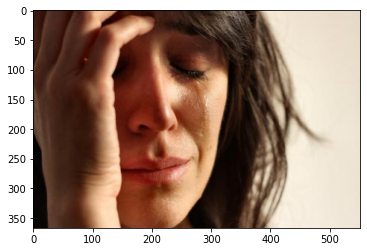

[[0.11450623 0.28539816 0.04281776 ... 0.31354278 0.00146312 0.46676776]]
what
if
ice
|
if
says
to
someone
to
choked
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if ice | if says to someone to choked at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


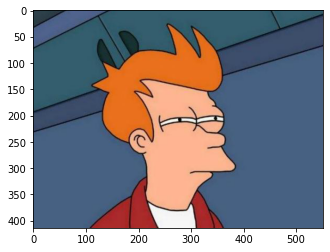

[[0.36741883 0.5417918  0.09456034 ... 0.03997346 0.10822345 0.35769844]]
spells
some
cds
still
lost
mind
|
after
lost
for
still
spells
some
cds
still
lost
tried
to
all
ago
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: spells some cds still lost mind | after lost for still spells some cds still lost tried to all ago at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


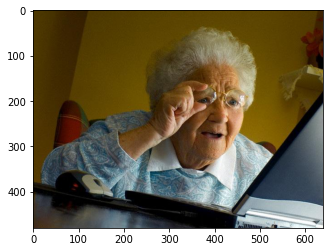

[[0.2245564  0.33777058 0.72900146 ... 0.4762189  0.18195452 0.48179793]]
anything
staying
peptobismol
|
pod
bought
staying
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: anything staying peptobismol | pod bought staying at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


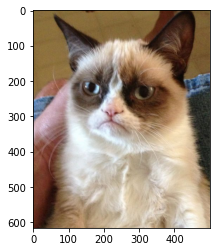

[[0.05204133 0.11240074 0.09322639 ... 0.2648343  0.80582005 0.5660813 ]]
what
if
service
peed
gun
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


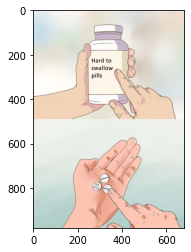

[[0.1751602  0.7909224  0.22280508 ... 0.2563989  0.6879705  0.14711566]]
if
drank
halloween
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: if drank halloween at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


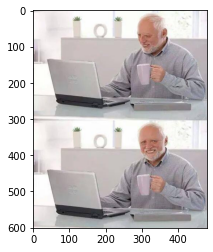

[[0.45209476 0.3021835  0.3295678  ... 0.8178084  0.4038697  0.3375771 ]]
pod
chickenella
runny
were
whistle
dont
to
all
the
south
snow
|
were
runny
were
whistle
dont
to
all
the
south
snow
loud
runny
were
whistle
dont
to
all
the
south
snow
loud
whistle
dont
to
all
the
south
snow
loud
whistle
dont
to
all
the
south
snow
Caption: pod chickenella runny were whistle dont to all the south snow | were runny were whistle dont to all the south snow loud runny were whistle dont to all the south snow loud whistle dont to all the south snow loud whistle dont to all the south
_____________________________________


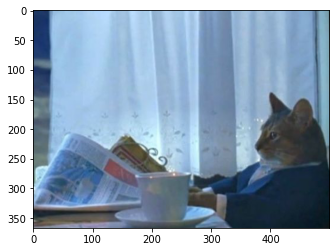

[[0.2779597  0.60031724 0.24767342 ... 1.1869545  1.9109535  0.72767115]]
old
immunities
feminine
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: old immunities feminine at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


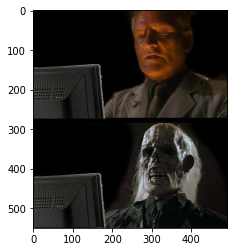

[[0.39799017 0.34631878 0.48824117 ... 0.9480561  0.41514054 0.6307082 ]]
grandmas
lost
flying
got
wearing
the
door
staying
health
day
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: grandmas lost flying got wearing the door staying health day at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


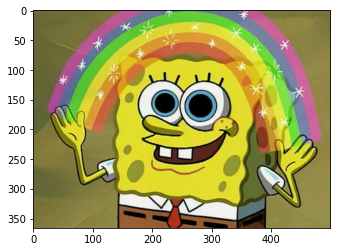

[[0.23726079 0.32120794 0.02941886 ... 0.48630965 2.0807512  0.02373927]]
what
if
service
peed
gun
|
and
if
service
peed
gun
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if service peed gun at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


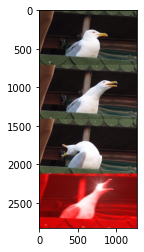

[[0.30116835 0.08668892 0.37502623 ... 0.54781234 0.31091136 0.7310089 ]]
what
if
service
peed
gun
|
and
if
service
peed
gun
|
what
if
service
peed
gun
|
what
if
service
peed
gun
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if service peed gun | what if service peed gun | what if service peed gun at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


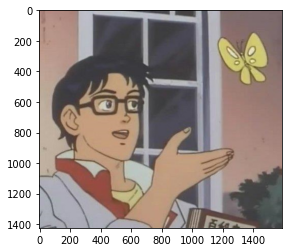

[[0.3180939  0.57393795 0.07128696 ... 0.41343474 0.89690346 0.62048125]]
never
|
pod
how
|
staying
peptobismol
post
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: never | pod how | staying peptobismol post at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


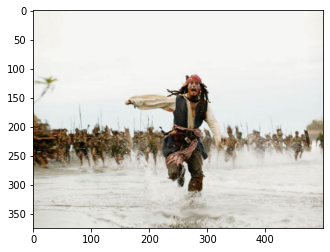

[[0.13127367 0.00679646 0.7577663  ... 0.5320336  0.74763083 0.23446786]]
lunch
runny
whistle
|
block
the
disappointment
staying
bottles
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: lunch runny whistle | block the disappointment staying bottles at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


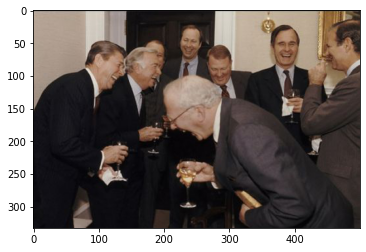

[[0.46194428 0.39718485 0.53098    ... 0.08337624 0.38759145 0.33870542]]
and
means
sleeps
runny
|
block
if
drank
spells
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: and means sleeps runny | block if drank spells at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


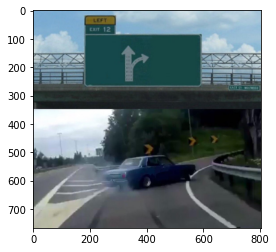

[[0.5345328  0.46059513 0.19012916 ... 0.20406333 0.10865623 0.14535363]]
the
brand
|
the
brand
|
the
brand
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: the brand | the brand | the brand at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


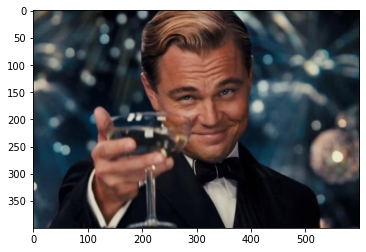

[[1.0445147  0.47780442 0.39523074 ... 1.1264651  0.61214954 0.35021847]]
to
lunch
the
fries
loud
names
says
to
someone
to
the
weird
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: to lunch the fries loud names says to someone to the weird | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


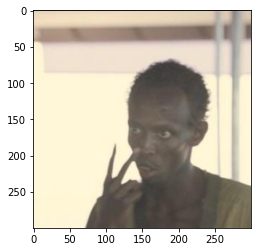

[[0.48091653 0.36726552 0.2405056  ... 0.0245162  0.09905454 0.6193024 ]]
what
if
ice
|
if
says
to
someone
to
choked
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if ice | if says to someone to choked at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


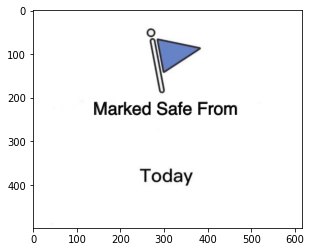

[[0.21766002 0.21671087 0.5140805  ... 0.24266852 0.23383373 0.4890374 ]]
what
if
service
peed
how
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed how | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


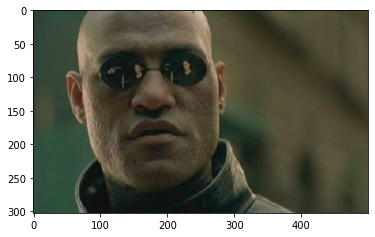

[[0.2864825  0.4278791  0.04290276 ... 0.29702076 0.         1.1253188 ]]
anything
cds
spreading
if
|
block
if
drank
spells
the
south
race
block
staying
spells
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: anything cds spreading if | block if drank spells the south race block staying spells at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


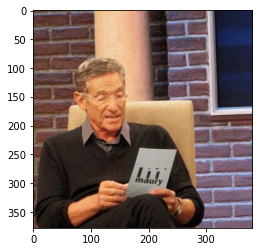

[[0.10769092 0.30396914 0.17992574 ... 0.6107559  0.17641245 0.72850984]]
if
runny
if
kermit
dont
to
all
the
teller
me
the
bolts
block
whistle
miley
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: if runny if kermit dont to all the teller me the bolts block whistle miley at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


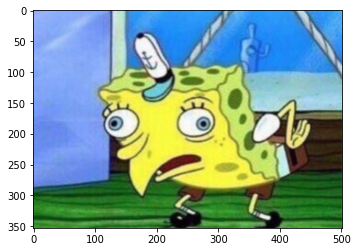

[[0.42788625 0.61207616 0.11558242 ... 0.73324317 0.4563342  0.07675066]]
what
if
salt
peed
age
|
and
if
salt
the
street
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if salt peed age | and if salt the street at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


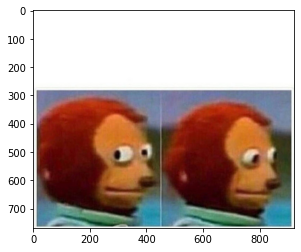

[[0.37401718 0.24192606 0.03292564 ... 0.35529947 0.3333138  0.10586124]]
what
if
service
peed
how
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed how | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


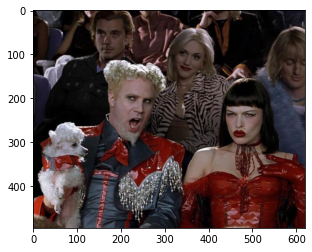

[[0.8088632  0.48362204 1.379652   ... 0.2560115  0.78159785 0.08642279]]
binfection
brick
indian
wifi
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: binfection brick indian wifi at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


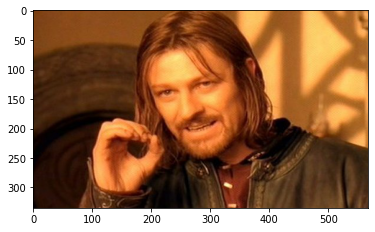

[[0.5859523  0.26448533 0.45997846 ... 1.1802385  0.43270704 0.53487974]]
snow
melts
spells
where
|
brainstorm
once
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: snow melts spells where | brainstorm once at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


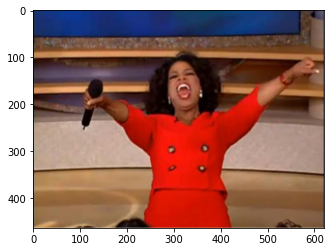

[[1.2905974  0.5153631  0.56886715 ... 0.6855855  1.0629312  0.77590466]]
if
salt
baby
fighter
|
if
salt
baby
fighter
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: if salt baby fighter | if salt baby fighter at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


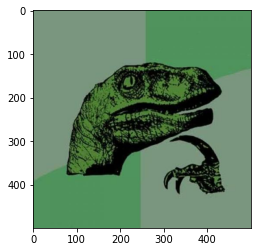

[[0.08654614 0.22290356 0.04924638 ... 1.0685884  0.20113635 0.15748605]]
cds
if
drank
baby
laurel
ironing
|
bed
look
if
says
to
all
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: cds if drank baby laurel ironing | bed look if says to all at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


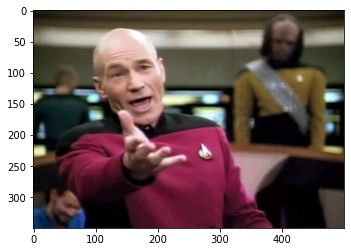

[[0.44511974 0.48658642 0.3913062  ... 0.23781371 0.14467786 0.04605996]]
bed
look
if
says
to
someone
to
choked
|
what
if
salt
the
forever
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: bed look if says to someone to choked | what if salt the forever at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


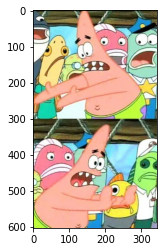

[[0.8215095  0.36322904 0.00814746 ... 0.072879   0.88494444 0.13665676]]
bed
names
jungle
answer
lunch
the
fries
word
the
brand
|
and
mostly
something
napping
astronaut
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: bed names jungle answer lunch the fries word the brand | and mostly something napping astronaut at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


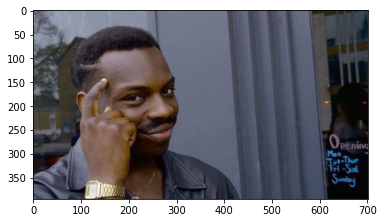

[[0.7702802  0.1355778  0.5603323  ... 0.8796446  0.8306462  0.24693502]]
if
italics
salt
panic
|
cds
if
names
says
cord
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: if italics salt panic | cds if names says cord at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


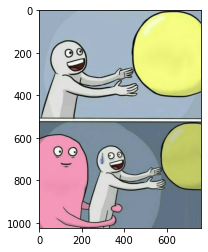

[[0.31121677 0.42593697 0.00479079 ... 0.05174346 0.26936585 0.35617366]]
never
|
never
|
pod
whenever
|
never
at
|
never
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: never | never | pod whenever | never at | never at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


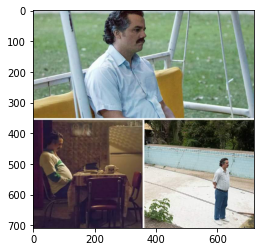

[[0.35241187 0.7843673  0.34242046 ... 0.24054252 0.3304801  0.22905105]]
what
if
service
peed
gun
|
and
if
service
peed
gun
|
what
if
service
peed
gun
|
what
if
service
peed
gun
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if service peed gun | what if service peed gun | what if service peed gun at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


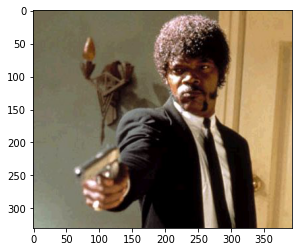

[[0.2896171  0.2761703  0.46886998 ... 0.28358978 0.42882088 0.12983954]]
driving
block
world
highly
if
at
|
highly
if
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: driving block world highly if at | highly if at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


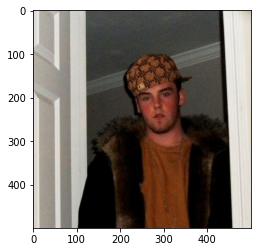

[[0.21146372 0.09155378 0.4070714  ... 0.06104229 1.8490975  0.4925873 ]]
what
if
salt
peed
age
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if salt peed age | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


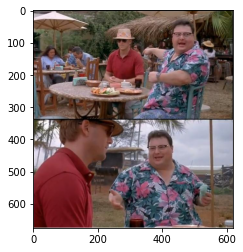

[[0.6668147  0.28119287 0.8692335  ... 0.9460814  1.3029339  0.3052773 ]]
shot
peptobismol
so
staying
dont
to
service
the
brand
lived
service
work
swimsuit
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: shot peptobismol so staying dont to service the brand lived service work swimsuit at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


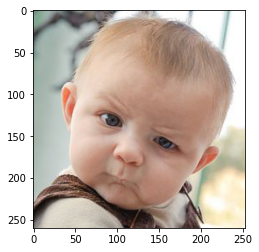

[[0.23578793 0.53416735 0.18631276 ... 0.27495164 0.0391074  0.24906148]]
binfection
becomes
another
never
block
if
says
to
breaks
coca
the
polar
|
always
if
says
to
breaks
coca
polar
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: binfection becomes another never block if says to breaks coca the polar | always if says to breaks coca polar at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


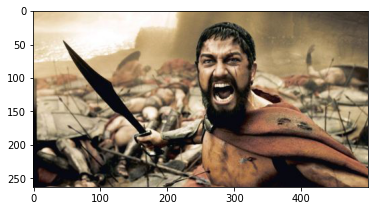

[[0.1393043  0.6672188  0.14817935 ... 0.92323405 0.163495   0.1039391 ]]
what
if
service
peed
how
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed how | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


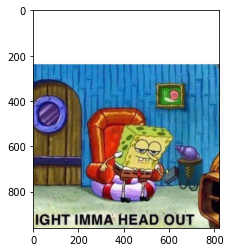

[[1.0119455  0.08711257 0.3274474  ... 0.31405824 0.40297326 0.00759565]]
what
if
salt
peed
age
|
and
if
says
to
someone
to
the
weird
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if salt peed age | and if says to someone to the weird at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


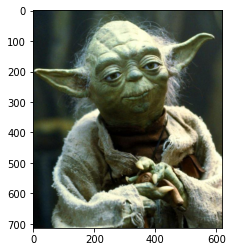

[[0.39088482 0.21074139 0.13847402 ... 0.638972   0.2536986  0.24975562]]
what
if
service
peed
gun
|
if
drank
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | if drank at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


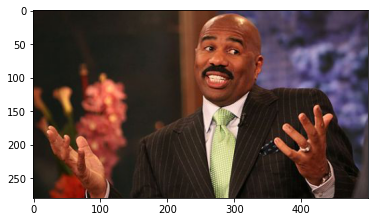

[[0.3220378  0.36556843 0.15955564 ... 0.21018812 0.20416036 0.09231637]]
anything
staying
the
buzz
chasing
the
brand
|
the
brand
staying
the
chivalrous
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: anything staying the buzz chasing the brand | the brand staying the chivalrous at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


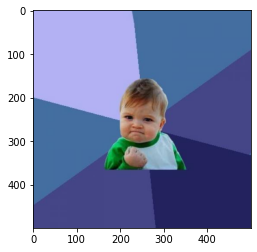

[[0.02857642 0.30258164 0.01679931 ... 0.3858589  0.29683188 0.14906248]]
what
if
salt
peed
age
|
and
if
ice
if
says
to
look
home
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if salt peed age | and if ice if says to look home at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


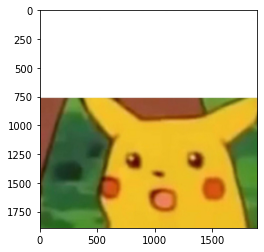

[[0.7921303  0.5022221  0.04085758 ... 0.27893633 0.273532   0.44116825]]
what
if
service
peed
gun
|
and
if
service
peed
gun
|
what
if
service
peed
gun
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if service peed gun | what if service peed gun at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


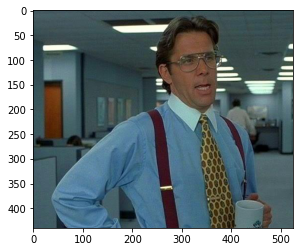

[[0.43932706 0.7049747  0.224005   ... 0.01488537 0.13804916 0.2103115 ]]
cds
if
stick
retarded
wheelchair
today
mcdonalds
the
thatll
sharts
block
steal
all
pretty
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: cds if stick retarded wheelchair today mcdonalds the thatll sharts block steal all pretty at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


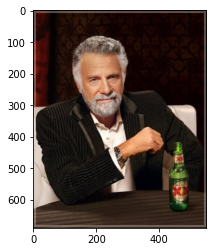

[[0.8394327  0.12737602 0.2461634  ... 0.21696095 0.3864905  0.05352384]]
names
die
brainstorm
today
always
what
look
listening
for
still
spells
some
anything
to
look
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: names die brainstorm today always what look listening for still spells some anything to look at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


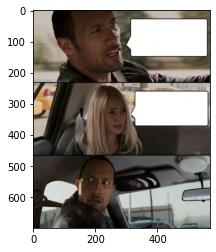

[[0.33407387 0.3001433  0.338086   ... 0.2573316  0.2836228  0.8242089 ]]
binfection
anything
look
if
winter
|
if
drank
dont
to
all
the
chivalrous
race
block
staying
the
chivalrous
race
block
staying
the
chivalrous
race
block
staying
the
chivalrous
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: binfection anything look if winter | if drank dont to all the chivalrous race block staying the chivalrous race block staying the chivalrous race block staying the chivalrous at at at at at at at at at at at at at at at at at at at
_____________________________________


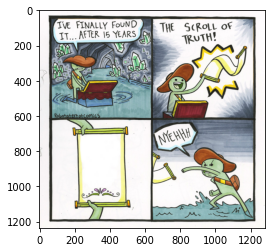

[[0.10558087 0.44954658 0.00995889 ... 0.5481167  0.42934674 1.2785459 ]]
if
drank
halloween
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: if drank halloween at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


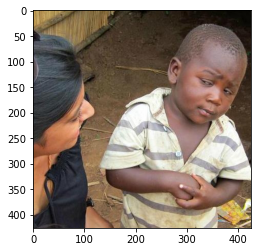

[[0.570562   0.44919917 0.6349038  ... 0.48903346 0.6198802  0.42516083]]
binfection
becomes
another
never
block
if
says
to
breaks
coca
the
polar
|
always
if
says
to
breaks
coca
polar
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: binfection becomes another never block if says to breaks coca the polar | always if says to breaks coca polar at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


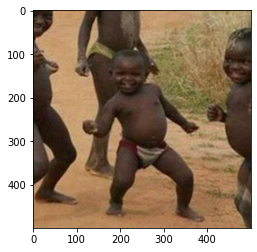

[[0.14612669 0.11676116 0.25771248 ... 0.01625674 0.4109011  0.45373395]]
what
if
salt
peed
age
|
and
if
salt
the
street
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if salt peed age | and if salt the street at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


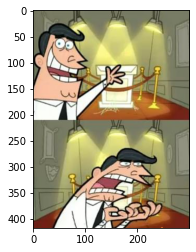

[[4.3497866e-01 4.3853766e-01 3.3541390e-04 ... 1.1246570e-02
  1.0717953e+00 3.0259877e-01]]
peptobismol
staying
cop
arthurs
mostly
pod
very
|
cds
hours
snow
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: peptobismol staying cop arthurs mostly pod very | cds hours snow at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


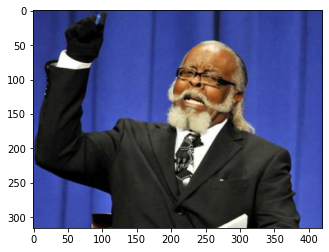

[[0.39648727 0.14935836 0.63724756 ... 0.25305992 0.2166619  0.00166685]]
the
luck
me
fries
loud
driving
block
|
staying
battle
smart
animal
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: the luck me fries loud driving block | staying battle smart animal at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


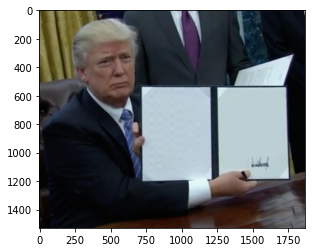

[[0.02793108 0.33127254 0.43359217 ... 0.31265402 0.79229796 0.39529824]]
the
brand
staying
the
chivalrous
race
|
the
brand
staying
the
chivalrous
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: the brand staying the chivalrous race | the brand staying the chivalrous at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


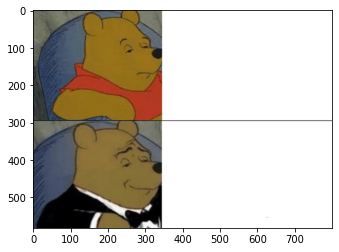

[[0.19160861 0.27229023 0.05898777 ... 0.28940487 0.34560066 0.17957237]]
what
if
service
peed
gun
|
and
if
says
to
someone
to
choked
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if says to someone to choked at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


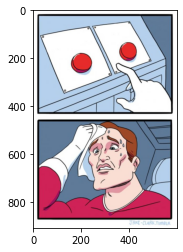

[[0.2948897  0.39632553 0.         ... 0.24626109 0.00230798 0.25736618]]
salt
sculpture
me
the
brand
|
days
the
brand
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: salt sculpture me the brand | days the brand at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


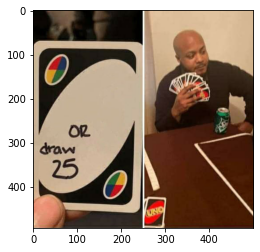

[[0.5591769  0.74272877 0.42845726 ... 0.16507244 0.5010637  0.38968462]]
never
|
spells
plastic
home
at
at
at
at
at
at
at
at
at
|
never
at
at
at
|
never
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: never | spells plastic home at at at at at at at at at | never at at at | never at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


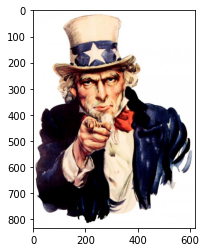

[[0.6913812  0.18235189 0.6312171  ... 0.33550528 0.27804533 0.19007932]]
in
if
to
retarded
wheelchair
today
|
and
spells
salt
home
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: in if to retarded wheelchair today | and spells salt home at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


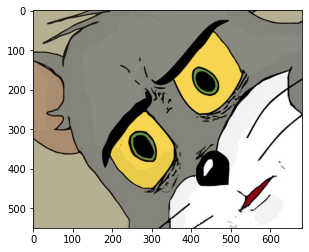

[[1.1417001  0.15374047 0.         ... 1.0449886  0.05808555 1.1530648 ]]
never
allotment
behind
to
salt
next
dim
corporation
|
my
astronaut
naked
the
clarity
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: never allotment behind to salt next dim corporation | my astronaut naked the clarity at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


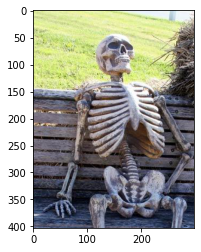

[[0.42552397 0.22588566 1.0226805  ... 0.42514214 0.580552   0.15427975]]
chipper
coca
the
can
to
salt
myselfand
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: chipper coca the can to salt myselfand at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


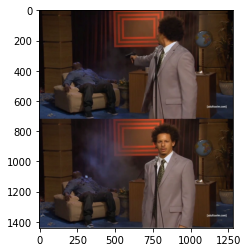

[[0.668004   0.2702092  0.64917195 ... 0.05049248 0.1554445  0.17146713]]
never
|
pod
how
|
pod
how
|
pod
how
|
never
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: never | pod how | pod how | pod how | never at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


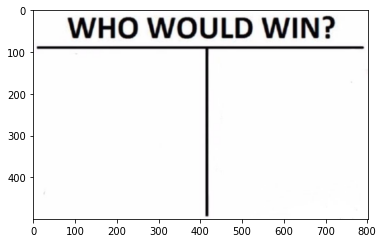

[[0.14978041 0.0468295  0.02411685 ... 0.15909986 0.01075067 0.2859151 ]]
what
if
service
peed
gun
|
and
if
says
to
someone
to
choked
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed gun | and if says to someone to choked at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


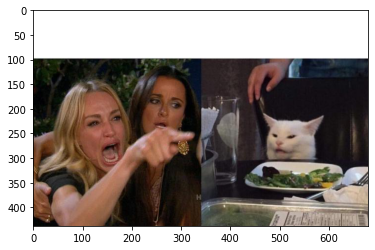

[[0.7688261  0.5335839  0.3858912  ... 0.7741434  0.7256342  0.37027732]]
if
runny
if
kermit
dont
to
all
the
south
snow
loud
runny
block
|
if
kermit
dont
to
all
the
south
snow
loud
runny
block
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: if runny if kermit dont to all the south snow loud runny block | if kermit dont to all the south snow loud runny block at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


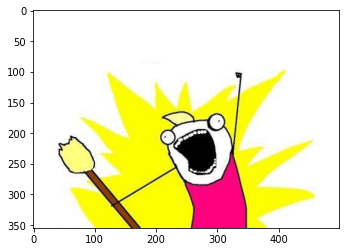

[[0.18808115 0.37781656 0.07076102 ... 0.7281573  0.31761414 0.12452044]]
what
if
service
peed
how
|
and
if
says
to
someone
to
choked
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: what if service peed how | and if says to someone to choked at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


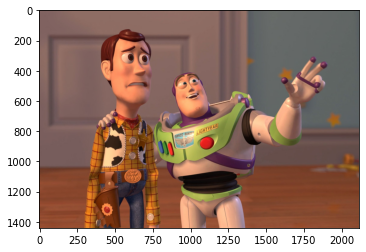

[[0.33354712 0.5284333  0.06369175 ... 0.09603561 0.20933637 0.5505241 ]]
mowgli
naked
block
|
if
service
block
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: mowgli naked block | if service block at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


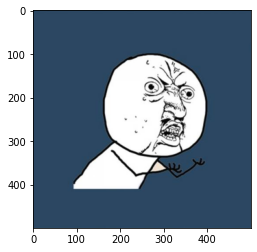

[[0.02642884 0.14982016 0.15719053 ... 0.19089596 0.00570038 0.08787608]]
he
|
brainstorm
today
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: he | brainstorm today at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


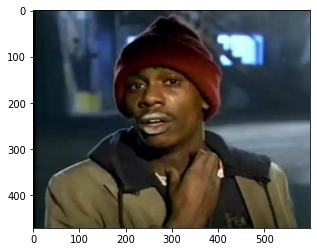

[[0.06023002 0.44282284 0.09888285 ... 0.40431756 0.1274296  1.042935  ]]
thing
of
proceed
house
me
something
|
today
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
at
Caption: thing of proceed house me something | today at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at at
_____________________________________


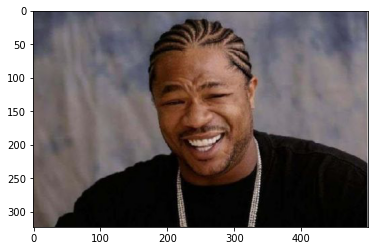

[[0.08696501 0.01939813 0.29955477 ... 1.105617   0.41601512 0.6982852 ]]
everyone
false
flat
if
day
if
|
binfection
mostly
peed
lift
word
peed
lift
binfection
if
fold
mostly
peed
lift
word
peed
lift
cheese
if
mostly
peed
lift
word
peed
lift
cheese
if
fold
someone
to
the
seconds
at
at
at
at
at
at
at
at
at
at
Caption: everyone false flat if day if | binfection mostly peed lift word peed lift binfection if fold mostly peed lift word peed lift cheese if mostly peed lift word peed lift cheese if fold someone to the seconds at at at at at at at at at
_____________________________________


In [31]:
  import matplotlib.pyplot as plt

  #img = 'Mocking-Spongebob.jpg'
  #img = 'I-Should-Buy-A-Boat-Cat.jpg'
  for img in train_descriptions.keys():
    image = encoding_train[f'{img}.jpg'].reshape((1,OUTPUT_DIM))
    x = plt.imread(os.path.join(root_path,'ImgFlip500K_Dataset','templates','img', f'{img}.jpg'))
    plt.imshow(x)
    plt.show()
    print(image)
    print("Caption:",generateCaption(image))
    print("_____________________________________")

In [32]:
len(all_train_captions)

452156

#Beam Search

In [33]:
def beam_search_predictions(image, beam_index = 3):
    start = [wordtoidx[START]]
    
    # start_word[0][0] = index of the starting word
    # start_word[0][1] = probability of the word predicted
    start_word = [[start, 0.0]]
    
    while len(start_word[0][0]) < max_length:
        temp = []
        for s in start_word:
            par_caps = pad_sequences([s[0]], maxlen=max_length, padding='post')
            e = encoding_train[image]
            preds = caption_model.predict([np.array([e]), np.array(par_caps)])
            
            # Getting the top <beam_index>(n) predictions
            word_preds = np.argsort(preds[0])[-beam_index:]
            
            # creating a new list so as to put them via the model again
            for w in word_preds:
                # print('w')
                # print(idxtoword[w])
                next_cap, prob = s[0][:], s[1]
                next_cap.append(w)
                prob += preds[0][w]
                temp.append([next_cap, prob])
                    
        start_word = temp
        print(temp)
        # Sorting according to the probabilities
        start_word = sorted(start_word, reverse=False, key=lambda l: l[1])
        # Getting the top words
        start_word = start_word[-beam_index:]
    print('start_word')
    for caption in start_word[-1]:
      print([idxtoword[i] for i in caption])
    print(start_word)
    start_word = start_word[-1][0]
    intermediate_caption = [idxtoword[i] for i in start_word]
    print(intermediate_caption)
    final_caption = []
    
    for i in intermediate_caption:
        if i != STOP:
            final_caption.append(i)
        else:
            break
    
    final_caption = ' '.join(final_caption[1:])
    return final_caption

In [34]:
# for img in train_descriptions.keys():
#   img =  f'{img}.jpg'
#   print(beam_search_predictions(img, 7))
#   x = plt.imread(os.path.join(root_path,'ImgFlip500K_Dataset','templates','img',img))
#   plt.imshow(x)
#   plt.show()
#   print(image)

In [35]:
    img = 'I-Should-Buy-A-Boat-Cat.jpg'
    photo = encoding_train[img].reshape((1,OUTPUT_DIM))
    in_text = START
    # for i in range(max_length):
    sequence = [wordtoidx[w] for w in in_text.split() if w in wordtoidx]
    sequence = pad_sequences([sequence], maxlen=max_length)
    yhat = caption_model.predict([photo,sequence], verbose=0)
    idxtoword[0]='0'
    # np.where(yhat[0] == yhat[0][2])[0][0]    
    probab = [[np.where(yhat[0] == p)[0][0], p] for p in list(yhat[0])]
    probab = [ [idxtoword[x[0]],x[1]] for x in probab if x[1]>0.01]
    probab

[['what', 0.026305566],
 ['never', 0.016782537],
 ['pod', 0.0155742215],
 ['lunch', 0.016641637],
 ['screams', 0.01003793],
 ['get', 0.01202184],
 ['old', 0.5046671]]

In [36]:
def beam_search(img, beam_index = 3):
  start = [wordtoidx[START]]
  start_word = [[start, 0.0]]
  e = encoding_train[img]
  print(e)
  while len(start_word[0][0]) < max_length:

    temp = []
    for s in start_word:

      par_caps = pad_sequences([s[0]], maxlen=max_length, padding='post')
      preds = caption_model.predict([np.array([e]), np.array(par_caps)])

      word_preds = np.argsort(preds[0])[-beam_index:]
      
      # print(word_preds)
      # creating a new list so as to put them via the model again
      for w in word_preds:
          # print(w)
          # print(idxtoword(w[0]))
          next_cap, prob = s[0][:], s[1]
          # print(next_cap)
          # print(idxtoword[next_cap[0]])
          next_cap.append(w)
          prob += preds[0][w]
          temp.append([next_cap, prob])
                              
          start_word = temp
          # print(temp)
          # Sorting according to the probabilities
          start_word = sorted(start_word, reverse=False, key=lambda l: l[1])
          # Getting the top words
          start_word = start_word[-beam_index:]
          
  # print('start_word')
  # print(start_word)
  l = []
  for rez in start_word:
     l.append([[idxtoword[i] for i in rez[0]],rez[1]])
  return l

    # print([[idxtoword[i] for i in caption[0]],caption[1]])
  # start_word = start_word[-1][0]
  # intermediate_caption = [idxtoword[i] for i in start_word]
  # print(intermediate_caption)
  # final_caption = []

  # for i in intermediate_caption:
  #     if i != STOP:
  #         final_caption.append(i)
  #     else:
  #         break

  # final_caption = ' '.join(final_caption[1:])
  # print(final_caption)

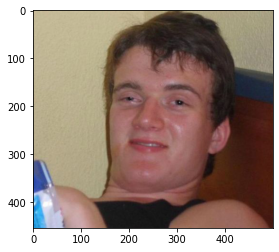

10-Guy.jpg
[0.53977937 0.14935113 0.17767063 ... 0.09022419 0.15059766 0.10495613]
['startseq', 'but', 'animal', 'drank', 'if', 'he', 'review', 'listening', 'usernames', 'but', 'drank', 'if', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'awkward']
['startseq', 'but', 'animal', 'drank', 'if', 'he', 'review', 'listening', 'usernames', 'but', 'drank', 'if', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'home']
['startseq', 'but', 'animal', 'drank', 'if', 'he', 'review', 'listening', 'usernames', 'but', 'drank', 'if', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '

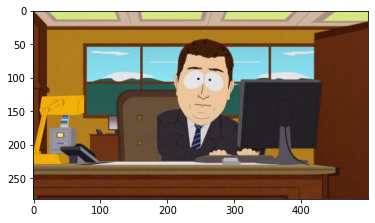

Aaaaand-Its-Gone.jpg
[0.663665   0.36402673 0.33930582 ... 0.618009   0.0384409  0.1010261 ]
['startseq', 'block', 'diet', 'what', 'if', 'are', 'to', 'someone', 'to', 'choked', '|', 'and', 'if', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'oldhams']
['startseq', 'block', 'diet', 'what', 'if', 'are', 'to', 'someone', 'to', 'choked', '|', 'and', 'if', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'anything']
['startseq', 'block', 'diet', 'what', 'if', 'are', 'to', 'someone', 'to', 'choked', '|', 'and', 'if', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at',

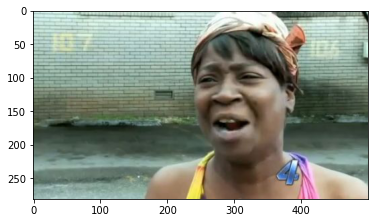

Aint-Nobody-Got-Time-For-That.jpg
[0.5661153  0.15732023 0.6688396  ... 1.0275943  0.6657373  0.41827863]
['startseq', 'mine', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'at', 'at', 'at', 'at', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'at', 'at', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'at', 'at', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'at', 'at', 'says']
['startseq', 'mine', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'at', 'at', 'at', 'at', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'at', 'at', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'at', 'at', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'at', 'at', 'home']
['startseq', 'mine', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'at', 'at', 'at', 'at', 'read', 'work', 'of', '

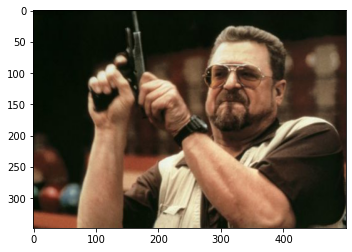

Am-I-The-Only-One-Around-Here.jpg
[0.51120174 0.16270036 0.05240588 ... 0.16754925 0.         0.13578865]


KeyboardInterrupt: 

In [37]:
for img in train_descriptions.keys():
  img =  f'{img}.jpg'
  x = plt.imread(os.path.join(root_path,'ImgFlip500K_Dataset','templates','img',img))
  plt.imshow(x)
  plt.show()
  print(img)
  for caption in beam_search(img, 20):
    print(caption[0])


#Custom Images

In [38]:
def end_search(captions):
  stop = wordtoidx[STOP]
  end = True
  for x in captions:
    print(f'x[0][-1]={x[0][-1]} stop={stop} equals={x[0][-1] == stop} len(x[0])={len(x[0])}')
    end = end and (x[0][-1] == stop or len(x[0]) >= max_length)
  print(f'end after {end}')
  return end

def diff_beam_search(img, beam_index = 3):
  start = [wordtoidx[START]]
  stop = wordtoidx[STOP]

  captions = [[start, 0.0]]
  first = True
  # while len(captions[0][0]) < max_length:
  while end_search(captions) == False:
    print(f'captions {captions}')
    temp = []
    for caption in captions:
      print(f'caption {caption} #########################################################')
      # if caption[0][-1] == stop:
      #   print(f'skip caption {caption}')
      #   continue
      par_caps = pad_sequences([caption[0]], maxlen=max_length, padding='post')
      preds = caption_model.predict([np.array([img]), np.array(par_caps)])

      # if first == True:
      #   np.random.shuffle(preds)
      #   word_preds = preds[0][-beam_index:]
      # else:
      print(f'preds {preds}')
      word_preds = np.argsort(preds[0])[-beam_index:]
      print(f'word preds {word_preds}')
      # creating a new list so as to put them via the model again
      for w in word_preds:
          print(f'w {w} {idxtoword[w]}')
          next_cap, prob = caption[0][:], caption[1]
          print(f'next_cap {next_cap} {idxtoword[next_cap[-1]]}')
          next_cap.append(w)
          prob = (preds[0][w]+prob)/2
          temp.append([next_cap, prob])
                              
          captions = temp
          # print(temp)
          # Sorting according to the probabilities
          captions = sorted(captions, reverse=False, key=lambda l: l[1])
          # Getting the top words
          captions = captions[-beam_index:]
          # if next_cap[-1] == stop:
          #   print('end')
          #   l = []
          #   for rez in captions:
          #     l.append([[idxtoword[i] for i in rez[0]],rez[1]])
          #   return l
          
  print(f'end_search(captions) {end_search(captions) }')
  print(f'captions {captions}')
  l = []
  for rez in captions:
      l.append([[idxtoword[i] for i in rez[0]],rez[1]])
  return l

In [39]:
img = tensorflow.keras.preprocessing.image.load_img(os.path.join(root_path,'custom_images','WIN_20190821_08_34_54_Pro.jpg'), target_size=(HEIGHT, WIDTH))
x = plt.imread(os.path.join(root_path,'custom_images','WIN_20190821_08_34_54_Pro.jpg'))
plt.imshow(x)
plt.show()
print(img)
for caption in diff_beam_search(encodeImage(img), 3):
  print(caption[0])

FileNotFoundError: [Errno 2] No such file or directory: './data/custom_images/WIN_20190821_08_34_54_Pro.jpg'

In [40]:
def end_search(captions):
  stop = wordtoidx[STOP]
  end = True
  for x in captions:
    # print(f'x[0][-1]={x[0][-1]} stop={stop} equals={x[0][-1] == stop} len(x[0])={len(x[0])}')
    end = end and (x[0][-1] == stop or len(x[0]) >= max_length)
  # print(f'end after {end}')
  return end

def diff_beam_search_train(img, beam_index = 3):
  start = [wordtoidx[START]]
  stop = wordtoidx[STOP]

  captions = [[start, 0.0]]
  first = True
  # while len(captions[0][0]) < max_length:
  while end_search(captions) == False:
    # print(f'captions {captions}')
    temp = []
    for caption in captions:
      # print(f'caption {caption} #########################################################')
      # if caption[0][-1] == stop:
      #   print(f'skip caption {caption}')
      #   continue
      par_caps = pad_sequences([caption[0]], maxlen=max_length, padding='post')
      preds = caption_model.predict([np.array([img]), np.array(par_caps)])

      # if first == True:
      #   np.random.shuffle(preds)
      #   word_preds = preds[0][-beam_index:]
      # else:
      # print(f'preds {preds}')
      word_preds = np.argsort(preds[0])[-beam_index:]
      # print(f'word preds {word_preds}')
      # creating a new list so as to put them via the model again
      for w in word_preds:
          # print(f'w {w} {idxtoword[w]}')
          next_cap, prob = caption[0][:], caption[1]
          # print(f'next_cap {next_cap} {idxtoword[next_cap[-1]]}')
          next_cap.append(w)
          prob = (preds[0][w]+prob)/2
          temp.append([next_cap, prob])
                              
          captions = temp
          # print(temp)
          # Sorting according to the probabilities
          captions = sorted(captions, reverse=False, key=lambda l: l[1])
          # Getting the top words
          captions = captions[-beam_index:]
          # if next_cap[-1] == stop:
          #   print('end')
          #   l = []
          #   for rez in captions:
          #     l.append([[idxtoword[i] for i in rez[0]],rez[1]])
          #   return l
          
  # print(f'end_search(captions) {end_search(captions) }')
  # print(f'captions {captions}')
  l = []
  for rez in captions:
      l.append([[idxtoword[i] for i in rez[0]],rez[1]])
  return l

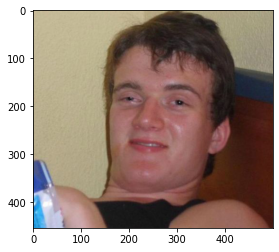

10-Guy.jpg
['startseq', 'pod', 'hope', 'runny', 'were', 'said', 'to', 'someone', 'to', 'choked', '|', 'always', 'were', 'runny', 'were', 'whistle', 'frog', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'pod', 'hope', 'runny', 'were', 'said', 'to', 'someone', 'to', 'choked', '|', 'always', 'were', 'runny', 'were', 'whistle', 'ironic', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'pod', 'hope', 'runny', 'were', 'said', 'to', 'someone', 'to', 'choked', '|', 'always', 'were', 'runny', 'were', 'whistle', 'dont', 'to', 'sheep', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at',

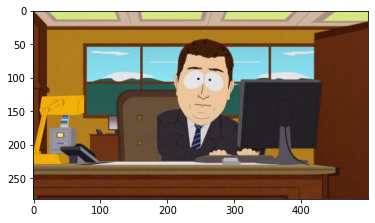

Aaaaand-Its-Gone.jpg
['startseq', 'block', 'diet', 'what', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'the', 'weird', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'block', 'diet', 'what', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'block', 'diet', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'block', 'diet', 'if', 'ice', 

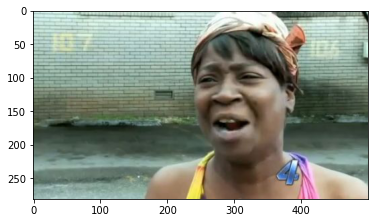

Aint-Nobody-Got-Time-For-That.jpg
['startseq', 'read', 'work', '|', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'read', 'work', 'of', 'black', 'coca', 'block', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'read', 'work', 'of', 'of', 'black', 'coca', 'block', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'read', 'work', '|', 'read', 

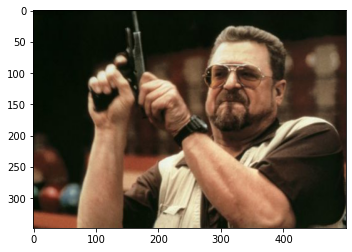

Am-I-The-Only-One-Around-Here.jpg
['startseq', 'screams', 'the', 'south', 'snow', 'robers', 'got', '|', 'loud', 'frostbite', 'cents', 'but', 'to', 'brainstorm', 'today', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'screams', 'the', 'south', 'snow', 'robers', 'got', '|', 'loud', 'frostbite', 'way', 'wont', 'mcdonalds', 'the', 'brand', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'screams', 'the', 'south', 'snow', 'robers', 'got', '|', 'loud', 'frostbite', 'way', 'wont', 'mcdonalds', 'peptobismol', 'once', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'a

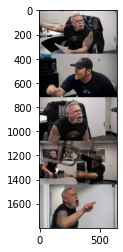

American-Chopper-Argument.jpg
['startseq', 'anything', 'look', 'if', 'look', 'what', 'if', 'says', 'to', 'someone', 'to', 'choked', '|', 'and', 'if', 'names', 'says', 'to', 'someone', 'to', 'choked', '|', 'what', 'if', 'someone', 'to', 'choked', 'at', '|', 'what', 'if', 'look', 'mine', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'anything', 'look', 'if', 'look', 'what', 'if', 'says', 'to', 'someone', 'to', 'choked', '|', 'and', 'if', 'names', 'says', 'to', 'someone', 'to', 'choked', '|', 'what', 'if', 'someone', 'to', 'choked', '|', 'what', 'if', 'says', 'to', 'look', 'mine', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'anything', 'look', 'if', 'look', 'what', 'if', 'says', 'to', 'someone', 'to', 'choked', '|', 'and', 'if', 'names', 'says', 'to', 'someone', 'to', 'choked', '|', 'what', 'if', 'someone', 'to', 'choked', 'at', '|', 'what', 'if', 'look', 'home', 'at', 'at', 'at', '

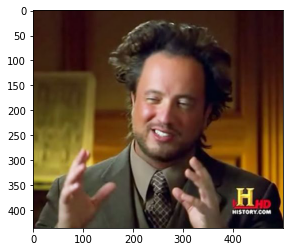

Ancient-Aliens.jpg
['startseq', 'eight', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'eight', 'at', 'at', 'at', 'eight', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'eight', 'at', 'at', '|', 'eight', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'eight', 'at', '|', 'eight', 'at', 'at', 'at', 'at', 'at', 'at', 'at'

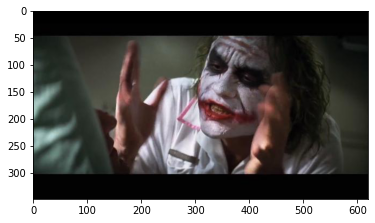

And-everybody-loses-their-minds.jpg
['startseq', 'he', 'snow', 'unusual', 'baby', 'summer', '|', 'and', 'my', 'pools', 'that', 'squirt', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'he', 'snow', 'unusual', 'baby', 'summer', '|', 'and', 'little', 'pools', 'that', 'squirt', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'he', 'snow', 'unusual', 'baby', 'summer', '|', 'and', 'little', 'pools', 'ashley', 'squirt', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['s

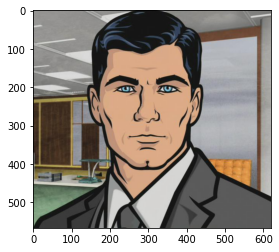

Archer.jpg
['startseq', 'look', 'if', 'in', 'if', 'to', 'brainstorm', 'some', 'open', 'but', 'if', 'salt', 'cord', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'look', 'if', 'in', 'if', 'to', 'brainstorm', 'some', 'open', 'but', 'if', 'salt', 'to', 'look', 'home', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'look', 'if', 'in', 'if', 'to', 'brainstorm', 'some', 'open', 'but', 'if', 'salt', 'eskimo', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'look', 'if', 'in', 'if', 'to'

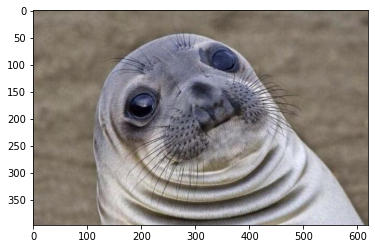

Awkward-Moment-Sealion.jpg
['startseq', 'the', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'neighbor', 'told', 'church', 'staying', 'he', 'father', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'the', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'neighbor', 'told', 'church', 'staying', 'he', 'father', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'the', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'neighbor', 'told', 'block', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 

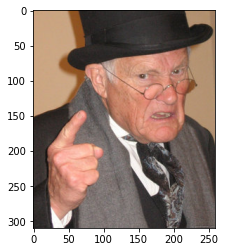

Back-In-My-Day.jpg
['startseq', 'secret', 'word', 'secret', 'word', 'pod', 'by', 'church', 'whistle', 'he', 'steering', 'race', 'word', 'the', 'florist', 'me', 'the', 'brand', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'secret', 'word', 'secret', 'word', 'pod', 'by', 'church', 'whistle', 'he', 'steering', 'race', 'word', 'the', 'brand', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'secret', 'word', 'secret', 'word', 'pod', 'by', 'church', 'whistle', 'he', 'steering', 'race', 'word', 'the', 'florist', 'me', 'the', 'brand', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at',

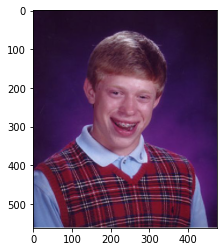

Bad-Luck-Brian.jpg
['startseq', 'election', 'the', 'bartender', 'crunchy', '|', 'judge', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'election', 'the', 'bartender', 'crunchy', '|', 'judge', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'election', 'the', 'bartender', 'crunchy', '|', 'pools', 'the', 'bartender', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'election', 

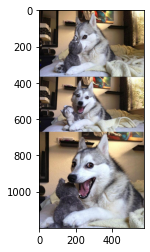

Bad-Pun-Dog.jpg
['startseq', 'whatever', 'if', 'fair', 'mcdonalds', 'the', 'so', 'loud', 'of', 'parachute', 'apparently', 'the', 'such', 'upvotes', 'me', 'the', 'such', 'upvotes', 'me', 'the', 'such', 'upvotes', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'to']
['startseq', 'whatever', 'if', 'fair', 'mcdonalds', 'the', 'so', 'loud', 'of', 'parachute', 'apparently', 'the', 'such', 'upvotes', 'me', 'the', 'such', 'upvotes', 'me', 'the', 'such', 'upvotes', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'if']
['startseq', 'whatever', 'if', 'fair', 'mcdonalds', 'the', 'so', 'loud', 'of', 'parachute', 'apparently', 'the', 'such', 'upvotes', 'me', 'the', 'such', 'upvotes', 'me', 'the', 'such', 'upvotes', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 

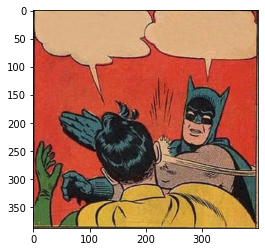

Batman-Slapping-Robin.jpg
['startseq', 'still', 'fruit', '|', 'try', 'pool', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'if']
['startseq', 'still', 'fruit', '|', 'try', 'pool', 'giveaway', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'still', 'fruit', '|', 'try', 'pool', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'still', 'fruit', '|', 'try', 'pool', 'giveaway'

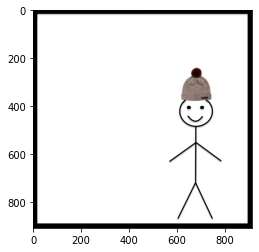

Be-Like-Bill.jpg
['startseq', 'peptobismol', 'staying', 'conspiracy', '|', 'conspiracy', 'visualize', 'he', 'broke', '|', 'all', 'day', 'conspiracy', 'at', '|', 'all', 'day', 'conspiracy', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'peptobismol', 'staying', 'conspiracy', '|', 'conspiracy', 'staying', 'beers', '|', 'all', 'day', 'conspiracy', 'at', '|', 'all', 'day', 'conspiracy', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'peptobismol', 'staying', 'conspiracy', '|', 'conspiracy', 'staying', 'beers', '|', 'all', 'day', 'automatically', 'at', '|', 'all', 'day', 'conspiracy', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 

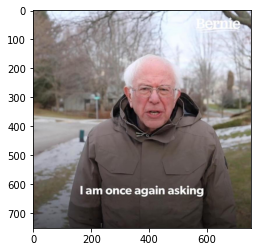

Bernie-I-Am-Once-Again-Asking-For-Your-Support.jpg
['startseq', 'block', 'diet', 'what', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'block', 'diet', 'what', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'the', 'weird', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'block', 'diet', 'what', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'person', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq'

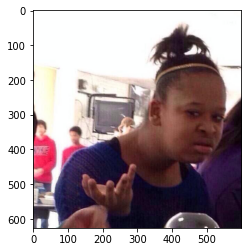

Black-Girl-Wat.jpg
['startseq', 'the', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'service', 'peed', 'gun', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'the', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'service', 'peed', 'gun', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'the', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'ice', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'block', 'tuna', 'i

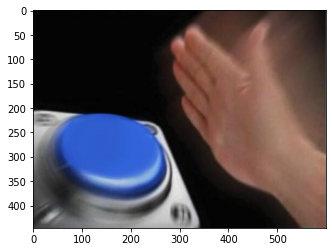

Blank-Nut-Button.jpg
['startseq', 'he', 'flossed', 'inches', '|', 'never', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'he', 'flossed', 'inches', 'at', '|', 'flossed', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'he', 'flossed', 'inches', '|', 'never', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|', 'never', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'he', 'flossed', 'inches', '|', 'never', 'at',

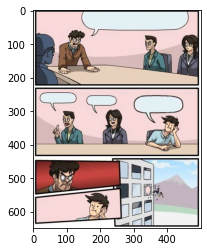

Boardroom-Meeting-Suggestion.jpg
['startseq', 'anything', 'old', 'jungle', 'look', 'coca', 'the', 'microsoft', 'charity', 'me', 'app', 'but', 'mcdonalds', 'home', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'anything', 'old', 'jungle', 'look', 'coca', 'the', 'microsoft', 'charity', 'me', 'app', 'but', 'mcdonalds', 'but', 'mcdonalds', 'home', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'anything', 'old', 'jungle', 'look', 'coca', 'the', 'microsoft', 'charity', 'me', 'app', 'but', 'mcdonalds', 'home', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at',

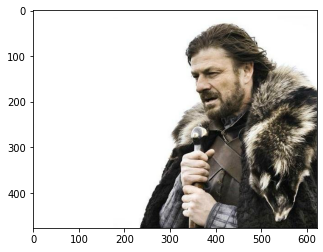

Brace-Yourselves-X-is-Coming.jpg
['startseq', 'snow', 'melts', 'spells', 'where', '|', 'reverse', 'peed', 'breaths', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'snow', 'melts', 'spells', 'where', '|', 'brainstorm', 'today', 'mcdonalds', 'home', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'snow', 'melts', 'spells', 'where', '|', 'brainstorm', 'today', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['star

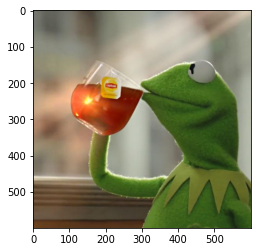

But-Thats-None-Of-My-Business.jpg
['startseq', 'peptobismol', 'staying', 'anything', 'spontaneous', '|', 'what', 'if', 'ice', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'always', 'open', 'puzzle', 'me', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'peptobismol', 'staying', 'anything', 'spontaneous', '|', 'what', 'if', 'ice', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'always', 'open', 'puzzle', 'me', 'pod', 'sown', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'peptobismol', 'staying', 'anything', 'spontaneous', '|', 'what', 'if', 'ice', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', '|', 'always', 'open', 'puzzle', 'me', 'pod', 'sown', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at'

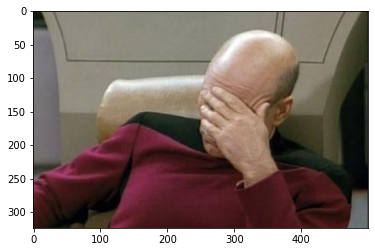

Captain-Picard-Facepalm.jpg
['startseq', 'the', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'service', 'peed', 'gun', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'the', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'service', 'peed', 'gun', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'the', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'ice', 'block', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'the', 

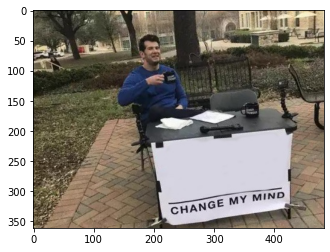

Change-My-Mind.jpg
['startseq', 'the', 'disappointment', 'staying', 'reduce', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'the', 'disappointment', 'staying', 'bottles', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'the', 'disappointment', 'staying', 'roseannes', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'the', 'disap

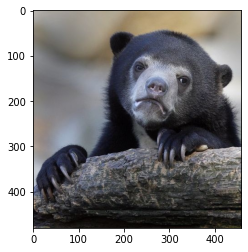

Confession-Bear.jpg
['startseq', 'what', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'if']
['startseq', 'what', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'to']
['startseq', 'what', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'what', 'if', 'ice', '|', 'if', 'says', 't

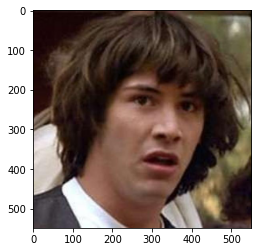

Conspiracy-Keanu.jpg
['startseq', 'anything', 'steal', 'save', 'cds', 'fries', 'drank', 'lost', 'for', 'trial', 'drank', 'word', 'the', 'warning', 'brand', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'anything', 'steal', 'save', 'cds', 'fries', 'drank', 'lost', 'for', 'trial', 'drank', 'word', 'the', 'brand', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'anything', 'steal', 'save', 'cds', 'fries', 'drank', 'lost', 'for', 'trial', 'drank', 'word', 'the', 'brand', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'a

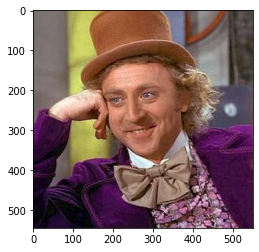

Creepy-Condescending-Wonka.jpg
['startseq', 'points', 'never', 'house', 'mcdonalds', 'but', 'if', 'cents', 'anything', 'if', 'drank', 'plastic', 'apparently', 'if', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'if']
['startseq', 'points', 'never', 'house', 'mcdonalds', 'but', 'if', 'cents', 'anything', 'if', 'drank', 'plastic', 'apparently', 'if', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'points', 'never', 'house', 'mcdonalds', 'but', 'if', 'cents', 'anything', 'if', 'drank', 'plastic', 'apparently', 'if', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'a

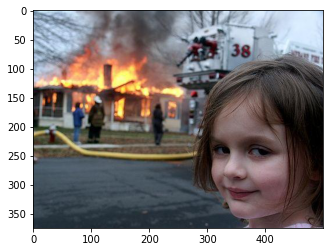

Disaster-Girl.jpg
['startseq', 'peptobismol', 'staying', 'anything', 'spontaneous', '|', 'what', 'if', 'names', 'cents', 'anything', 'trial', 'driving', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'peptobismol', 'staying', 'anything', 'spontaneous', '|', 'what', 'if', 'names', 'cents', 'anything', 'trial', 'look', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'peptobismol', 'staying', 'anything', 'spontaneous', '|', 'what', 'if', 'names', 'cents', 'anything', 'to', 'look', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 

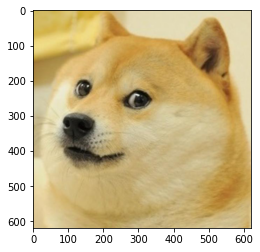

Doge.jpg
['startseq', 'what', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'choked', '|', 'and', 'if', 'says', 'to', 'someone', 'to', 'choked', '|', 'and', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'what', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'choked', '|', 'and', 'if', 'says', 'to', 'someone', 'to', 'choked', '|', 'and', 'if', 'says', 'to', 'look', 'mine', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'what', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'choked', '|', 'and', 'if', 'says', 'to', 'someone', 'to', 'choked', '|', 'and', 'if', 'says', 'to', 'look', 'home', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 

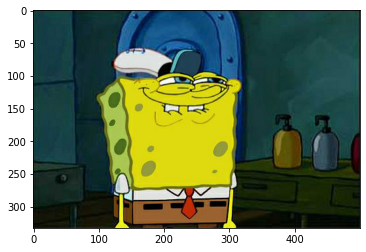

Dont-You-Squidward.jpg
['startseq', 'the', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'service', 'peed', 'gun', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'block', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'ice', 'block', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'the', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'ice', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'block'

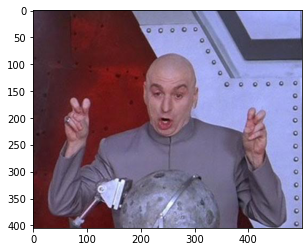

Dr-Evil-Laser.jpg
['startseq', 'peptobismol', 'staying', 'anything', 'spontaneous', '|', 'what', 'if', 'service', 'peed', 'gun', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'peptobismol', 'staying', 'anything', 'spontaneous', '|', 'what', 'if', 'service', 'peed', 'gun', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'peptobismol', 'staying', 'anything', 'spontaneous', 'what', 'if', 'ice', '|', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at

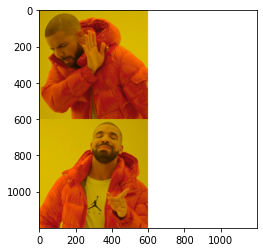

Drake-Hotline-Bling.jpg
['startseq', 'get', '|', 'get', '|', 'get', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'get', '|', 'never', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'get', '|', 'get', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'get', '|', 'stoned', 'needless', 'at', 'at', 'at', 'at', 'at', 'at', 'at'

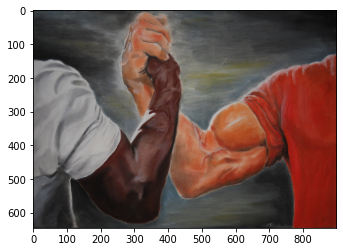

Epic-Handshake.jpg
['startseq', 'get', '|', 'get', '|', 'get', '|', 'get', 'at', '|', 'get', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'get', '|', 'get', '|', 'get', '|', 'get', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'get', '|', 'get', '|', 'get', '|', 'get', 'at', '|', 'get', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'get', '|', 'get', '|', 'get', '|', 'get', 'at', 'at', 'at', 'at', 'at', 'at', 'a

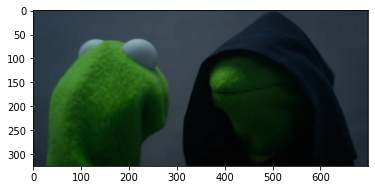

Evil-Kermit.jpg
['startseq', 'still', 'dont', 'to', 'someone', 'to', 'choked', '|', 'he', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'still', 'dont', 'to', 'someone', 'to', 'choked', '|', 'he', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'still', 'dont', 'to', 'someone', 'to', 'choked', '|', 'still', 'spells', 'dont', 'to', 'sheep', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'still', 'dont', 'to', 'someone', 't

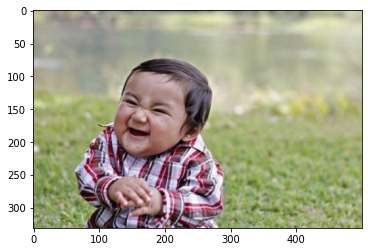

Evil-Toddler.jpg
['startseq', 'block', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'neighbor', 'told', 'church', 'staying', 'overnight', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'block', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'neighbor', 'told', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'block', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'neighbor', 'told', 'church', 'staying', 'he', 'snow', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '

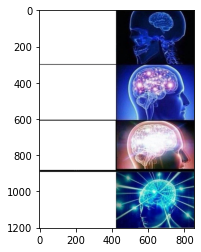

Expanding-Brain.jpg
['startseq', 'get', '|', 'get', '|', 'get', '|', 'get', '|', 'get', '|', 'get', '|', 'get', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'get', '|', 'get', '|', 'get', '|', 'get', '|', 'get', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'get', '|', 'get', '|', 'get', '|', 'get', 'at', '|', 'get', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'get', '|', 'get', '|', 'get', '|', 'get', '|', 'get', '|', 'get', 'at', 'at', '

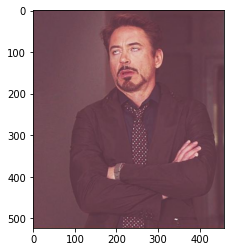

Face-You-Make-Robert-Downey-Jr.jpg
['startseq', 'block', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'ice', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'block', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'ice', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'chips', 'at']
['startseq', 'block', 'tuna', 'if', 'brainstorm', '|', 'what', 'if', 'ice', 'block', 'if', 'says', 'to', 'someone', 'to', 'choked', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '

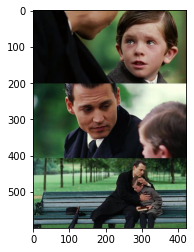

Finding-Neverland.jpg
['startseq', 'cold', 'bed', 'look', 'if', 'in', 'to', 'someone', 'to', 'choked', '|', 'he', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'if']
['startseq', 'cold', 'bed', 'look', 'if', 'in', 'to', 'someone', 'to', 'choked', '|', 'he', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'service']
['startseq', 'cold', 'bed', 'look', 'if', 'in', 'to', 'someone', 'to', 'choked', '|', 'he', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'cold', 'bed', 'look', 'if', 'in', 

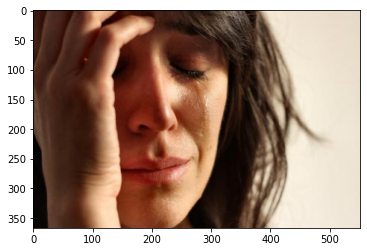

First-World-Problems.jpg
['startseq', 'what', 'if', 'neighbor', 'told', '|', 'if', 'says', 'to', 'someone', 'to', 'the', 'weird', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'to']
['startseq', 'what', 'if', 'neighbor', 'told', '|', 'if', 'says', 'to', 'someone', 'to', 'the', 'weird', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'what', 'if', 'neighbor', 'told', '|', 'if', 'says', 'to', 'someone', 'to', 'the', 'weird', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', 'what', 'if', 'ne

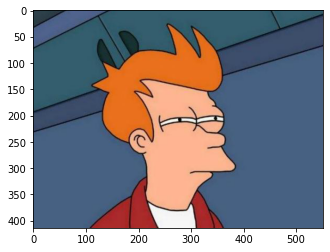

Futurama-Fry.jpg
['startseq', 'spells', 'some', 'cds', 'listening', 'lost', 'never', '|', 'after', 'cds', 'if', 'drank', 'some', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'after']
['startseq', 'spells', 'some', 'cds', 'listening', 'lost', 'never', '|', 'after', 'cds', 'if', 'drank', 'some', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'spells', 'some', 'cds', 'listening', 'lost', 'never', '|', 'after', 'cds', 'if', 'drank', 'some', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['startseq', '

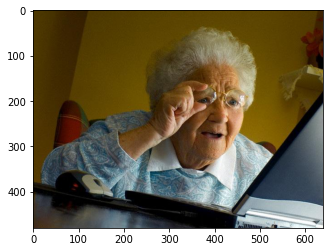

Grandma-Finds-The-Internet.jpg
['startseq', 'what', 'peed', 'bought', 'vacation', '|', 'the', 'door', 'staying', 'health', 'day', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'block']
['startseq', 'what', 'peed', 'bought', 'vacation', '|', 'the', 'door', 'staying', 'health', 'day', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'and']
['startseq', 'what', 'peed', 'bought', 'vacation', '|', 'the', 'door', 'staying', 'health', 'day', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', '|']
['s

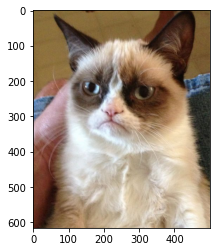

Grumpy-Cat.jpg
['startseq', 'cds', 'if', 'in', 'to', 'someone', 'to', 'the', 'weird', '|', 'if', 'names', 'says', 'to', 'someone', 'to', 'the', 'weird', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'cds', 'if', 'in', 'to', 'someone', 'to', 'the', 'weird', '|', 'means', 'if', 'names', 'cents', 'but', 'to', 'look', 'home', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'cds', 'if', 'in', 'to', 'someone', 'to', 'the', 'weird', '|', 'means', 'if', 'names', 'in', 'to', 'someone', 'to', 'the', 'weird', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at', 'at']
['startseq', 'cds', 'if', 'in'

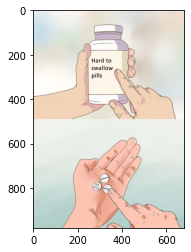

Hard-To-Swallow-Pills.jpg


In [ ]:
for img in train_descriptions.keys():
  img =  f'{img}.jpg'
  x = plt.imread(os.path.join(root_path,'ImgFlip500K_Dataset','templates','img',img))
  plt.imshow(x)
  plt.show()
  print(img)
  for caption in diff_beam_search_train(encoding_train[img], 5):
    print(caption[0])

In [ ]:
# img0 = encoding_train['Mocking-Spongebob.jpg']
# img1 = encoding_train['Left-Exit-12-Off-Ramp.jpg']
start = [wordtoidx[START]]
caption = [start, 0.0]
par_caps = pad_sequences([caption[0]], maxlen=max_length, padding='post')
preds=[]
for img in train_descriptions.keys():
  img =  f'{img}.jpg'
  e = encoding_train[img]
  preds.append(caption_model.predict([np.array([e]), np.array(par_caps)]))

In [ ]:
for p in preds:
  print(p==preds[0].all())